# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

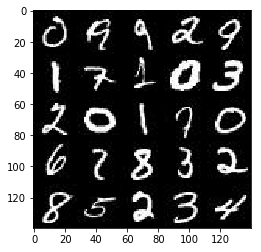

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

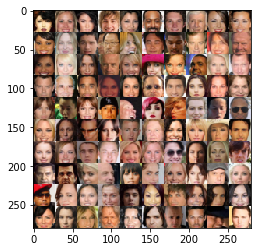

In [3]:
show_n_images = 100

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32,shape=(None,image_width,image_height,image_channels), name ="input_real")
    input_z = tf.placeholder(tf.float32,shape=(None,z_dim), name ="input_z")
    learning_rate = tf.placeholder(tf.float32,name="learning_rate")

    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/home/carnd/anaconda3/envs/dl5/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/home/carnd/anaconda3/envs/dl5/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/home/carnd/anaconda3/envs/dl5/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/home/carnd/anaconda3/envs/dl5/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/home/carnd/anaconda3/envs/dl5/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()', 'File "/home/carnd/anaconda3/en

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator',reuse = reuse):
        #Input layer is 28*28*3
        x1 = tf.layers.conv2d(images,64,5,strides=2,padding='same')
        relu1 = tf.maximum(0.2*x1,x1)
        #14*14*64
        
        x2 = tf.layers.conv2d(relu1,128,5,strides=2,padding='same')
        bn2 = tf.layers.batch_normalization(x2,training=True)
        relu2 = tf.maximum(0.2*x2,bn2)
        #7*7*128
        
        flat = tf.reshape(relu2,(-1,7*7*128))
        logits = tf.layers.dense(flat,1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator',reuse=not is_train):
        alpha = 0.2
        x1 = tf.layers.dense(z,7*7*256)
        #reshape to start the convolutional stack
        x1 = tf.reshape(x1,(-1,7,7,256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha*x1,x1)
        #7*7*256 now
        print ('x1')
        print (x1.shape)
        
        x2 = tf.layers.conv2d_transpose(x1, 128, 5 ,strides=2,padding='same')
        x2 = tf.layers.batch_normalization(x2,training=is_train)
        x2 = tf.maximum(alpha*x2,x2)
        #14*14*128 now
        print ('x2')
        print (x2.shape)
        
        logits = tf.layers.conv2d_transpose(x2, out_channel_dim ,5,strides=2,padding='same')
        #28*28*3 now
        print ('logits')
        print (logits.shape)
        
        out  = tf.tanh(logits)
           
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 5)
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 5)
Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z,out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse = True)
    #nm can be improved
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)) )
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
        
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 4)
Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    #Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(d_loss,var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(g_loss,var_list=g_vars)
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_opt,g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    print_every = 10
    show_every = 100
    losses = []
    n_images = 25 
   
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps = steps+1
                batch_images = batch_images * 2.0                
                             
                # Random Noise for G
                batch_z = np.random.uniform(-1,1,size=(batch_size,z_dim))
                
                # Run Optimizers
                _ = sess.run(d_opt, feed_dict = {input_real:batch_images, input_z:batch_z, lr:learning_rate})
                _ = sess.run(g_opt, feed_dict = {input_real:batch_images,input_z:batch_z, lr:learning_rate})
                
                if steps % print_every ==0:
                    train_loss_d = d_loss.eval({input_z:batch_z, input_real:batch_images})
                    train_loss_g = g_loss.eval({input_z:batch_z})
                    
                    print("Epoch {}/{}..." .format(epoch_i+1,epoch_count),
                    "Discriminator Loss: {:.4f}..." .format(train_loss_d),
                    "Generator Loss: {:.4f}" .format(train_loss_g))
                    
                    losses.append((train_loss_d,train_loss_g))
                
                if steps % show_every == 0:
                    show_generator_output(sess, n_images, input_z, image_channels, data_image_mode)
                
                
                    
                    
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 1)
Epoch 1/2... Discriminator Loss: 0.0356... Generator Loss: 10.4272
Epoch 1/2... Discriminator Loss: 0.6567... Generator Loss: 2.8124
Epoch 1/2... Discriminator Loss: 1.8992... Generator Loss: 2.5254
Epoch 1/2... Discriminator Loss: 1.3797... Generator Loss: 0.6595
Epoch 1/2... Discriminator Loss: 2.4759... Generator Loss: 0.1190
Epoch 1/2... Discriminator Loss: 1.2261... Generator Loss: 1.1156
Epoch 1/2... Discriminator Loss: 1.2636... Generator Loss: 0.6088
Epoch 1/2... Discriminator Loss: 2.2931... Generator Loss: 2.3871
Epoch 1/2... Discriminator Loss: 1.8510... Generator Loss: 1.9600
Epoch 1/2... Discriminator Loss: 1.5822... Generator Loss: 0.3726
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 1)


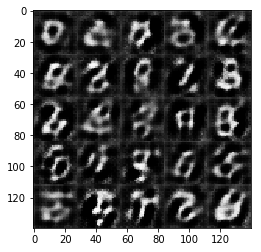

Epoch 1/2... Discriminator Loss: 1.4141... Generator Loss: 0.3978
Epoch 1/2... Discriminator Loss: 1.2310... Generator Loss: 1.1833
Epoch 1/2... Discriminator Loss: 1.4502... Generator Loss: 0.4461
Epoch 1/2... Discriminator Loss: 1.2733... Generator Loss: 0.8537
Epoch 1/2... Discriminator Loss: 1.3233... Generator Loss: 1.5880
Epoch 1/2... Discriminator Loss: 1.5749... Generator Loss: 2.1509
Epoch 1/2... Discriminator Loss: 1.8985... Generator Loss: 0.2338
Epoch 1/2... Discriminator Loss: 1.3936... Generator Loss: 0.4442
Epoch 1/2... Discriminator Loss: 1.1759... Generator Loss: 1.0393
Epoch 1/2... Discriminator Loss: 1.5972... Generator Loss: 0.3231
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 1)


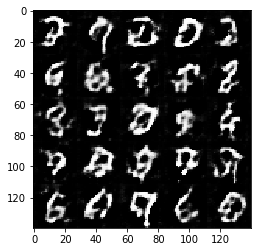

Epoch 1/2... Discriminator Loss: 1.1316... Generator Loss: 0.5845
Epoch 1/2... Discriminator Loss: 1.1548... Generator Loss: 0.5335
Epoch 1/2... Discriminator Loss: 1.2123... Generator Loss: 1.4103
Epoch 1/2... Discriminator Loss: 1.1415... Generator Loss: 0.6756
Epoch 1/2... Discriminator Loss: 1.4043... Generator Loss: 0.4112
Epoch 1/2... Discriminator Loss: 1.1353... Generator Loss: 1.1696
Epoch 1/2... Discriminator Loss: 1.0753... Generator Loss: 1.4578
Epoch 1/2... Discriminator Loss: 1.4541... Generator Loss: 1.7301
Epoch 1/2... Discriminator Loss: 1.4603... Generator Loss: 2.1318
Epoch 1/2... Discriminator Loss: 1.1335... Generator Loss: 0.5741
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 1)


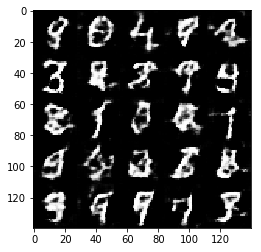

Epoch 1/2... Discriminator Loss: 1.4225... Generator Loss: 0.4240
Epoch 1/2... Discriminator Loss: 1.2248... Generator Loss: 1.6455
Epoch 1/2... Discriminator Loss: 1.0390... Generator Loss: 0.8844
Epoch 1/2... Discriminator Loss: 1.9011... Generator Loss: 0.2140
Epoch 1/2... Discriminator Loss: 1.1271... Generator Loss: 0.6563
Epoch 1/2... Discriminator Loss: 1.1551... Generator Loss: 0.7449
Epoch 1/2... Discriminator Loss: 1.1728... Generator Loss: 1.0087
Epoch 1/2... Discriminator Loss: 1.2407... Generator Loss: 1.2024
Epoch 1/2... Discriminator Loss: 1.3234... Generator Loss: 0.4762
Epoch 1/2... Discriminator Loss: 1.6514... Generator Loss: 1.8780
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 1)


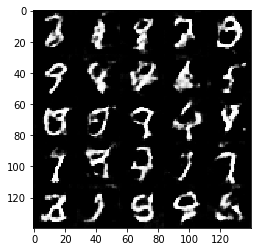

Epoch 1/2... Discriminator Loss: 1.1557... Generator Loss: 0.9208
Epoch 1/2... Discriminator Loss: 1.2308... Generator Loss: 0.5524
Epoch 1/2... Discriminator Loss: 1.1789... Generator Loss: 0.7515
Epoch 1/2... Discriminator Loss: 1.4637... Generator Loss: 0.3544
Epoch 1/2... Discriminator Loss: 1.4790... Generator Loss: 0.3536
Epoch 1/2... Discriminator Loss: 1.1287... Generator Loss: 0.7711
Epoch 2/2... Discriminator Loss: 1.0119... Generator Loss: 0.9830
Epoch 2/2... Discriminator Loss: 1.2327... Generator Loss: 0.5417
Epoch 2/2... Discriminator Loss: 1.1964... Generator Loss: 1.1312
Epoch 2/2... Discriminator Loss: 1.1409... Generator Loss: 0.7380
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 1)


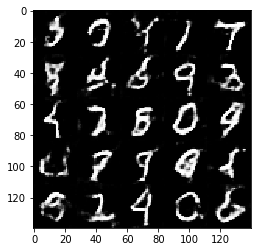

Epoch 2/2... Discriminator Loss: 1.4260... Generator Loss: 0.4120
Epoch 2/2... Discriminator Loss: 1.3513... Generator Loss: 0.4231
Epoch 2/2... Discriminator Loss: 1.8817... Generator Loss: 0.2171
Epoch 2/2... Discriminator Loss: 1.1314... Generator Loss: 0.8081
Epoch 2/2... Discriminator Loss: 1.1622... Generator Loss: 0.5612
Epoch 2/2... Discriminator Loss: 1.3211... Generator Loss: 1.6550
Epoch 2/2... Discriminator Loss: 1.6210... Generator Loss: 0.3020
Epoch 2/2... Discriminator Loss: 1.3777... Generator Loss: 0.4137
Epoch 2/2... Discriminator Loss: 1.3266... Generator Loss: 0.4413
Epoch 2/2... Discriminator Loss: 1.1682... Generator Loss: 0.6521
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 1)


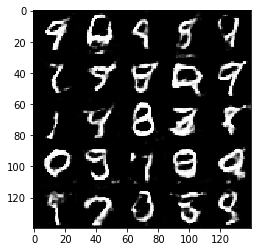

Epoch 2/2... Discriminator Loss: 1.1404... Generator Loss: 0.6023
Epoch 2/2... Discriminator Loss: 1.3686... Generator Loss: 0.4354
Epoch 2/2... Discriminator Loss: 1.0995... Generator Loss: 0.7232
Epoch 2/2... Discriminator Loss: 1.0457... Generator Loss: 0.8213
Epoch 2/2... Discriminator Loss: 0.9937... Generator Loss: 1.0738
Epoch 2/2... Discriminator Loss: 1.5343... Generator Loss: 0.3401
Epoch 2/2... Discriminator Loss: 1.3985... Generator Loss: 1.7590
Epoch 2/2... Discriminator Loss: 1.0253... Generator Loss: 0.8346
Epoch 2/2... Discriminator Loss: 1.0490... Generator Loss: 0.8146
Epoch 2/2... Discriminator Loss: 1.0269... Generator Loss: 1.0882
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 1)


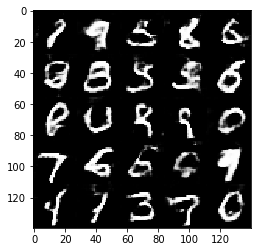

Epoch 2/2... Discriminator Loss: 1.0482... Generator Loss: 1.4692
Epoch 2/2... Discriminator Loss: 1.5233... Generator Loss: 0.3531
Epoch 2/2... Discriminator Loss: 1.3089... Generator Loss: 1.7439
Epoch 2/2... Discriminator Loss: 1.4003... Generator Loss: 0.3806
Epoch 2/2... Discriminator Loss: 1.2155... Generator Loss: 0.5885
Epoch 2/2... Discriminator Loss: 1.2234... Generator Loss: 1.6425
Epoch 2/2... Discriminator Loss: 1.1086... Generator Loss: 0.6152
Epoch 2/2... Discriminator Loss: 1.3489... Generator Loss: 1.9689
Epoch 2/2... Discriminator Loss: 1.0492... Generator Loss: 1.2438
Epoch 2/2... Discriminator Loss: 1.2396... Generator Loss: 0.5451
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 1)


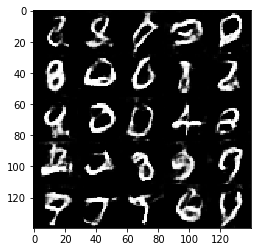

Epoch 2/2... Discriminator Loss: 1.0036... Generator Loss: 1.2299
Epoch 2/2... Discriminator Loss: 1.3481... Generator Loss: 0.4207
Epoch 2/2... Discriminator Loss: 1.0162... Generator Loss: 1.0417
Epoch 2/2... Discriminator Loss: 1.5496... Generator Loss: 2.3555
Epoch 2/2... Discriminator Loss: 1.5231... Generator Loss: 0.3492
Epoch 2/2... Discriminator Loss: 1.2152... Generator Loss: 0.5347
Epoch 2/2... Discriminator Loss: 1.6151... Generator Loss: 2.3550
Epoch 2/2... Discriminator Loss: 1.2274... Generator Loss: 0.5073
Epoch 2/2... Discriminator Loss: 0.9303... Generator Loss: 1.1985
Epoch 2/2... Discriminator Loss: 1.2254... Generator Loss: 1.6091
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 1)


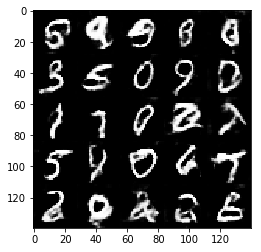

Epoch 2/2... Discriminator Loss: 1.0535... Generator Loss: 1.2835
Epoch 2/2... Discriminator Loss: 1.4025... Generator Loss: 2.0007
Epoch 2/2... Discriminator Loss: 1.0118... Generator Loss: 1.0463


In [12]:
batch_size = 128
z_dim = 100
learning_rate = .002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)
Epoch 1/5... Discriminator Loss: 1.2120... Generator Loss: 1.1526
Epoch 1/5... Discriminator Loss: 0.0481... Generator Loss: 4.4557
Epoch 1/5... Discriminator Loss: 0.0849... Generator Loss: 5.6036
Epoch 1/5... Discriminator Loss: 2.2110... Generator Loss: 0.1904
Epoch 1/5... Discriminator Loss: 0.5816... Generator Loss: 4.0569
Epoch 1/5... Discriminator Loss: 0.8203... Generator Loss: 2.1369
Epoch 1/5... Discriminator Loss: 0.3128... Generator Loss: 2.3517
Epoch 1/5... Discriminator Loss: 0.7053... Generator Loss: 3.4676
Epoch 1/5... Discriminator Loss: 1.9197... Generator Loss: 0.3427
Epoch 1/5... Discriminator Loss: 1.2297... Generator Loss: 0.6150
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


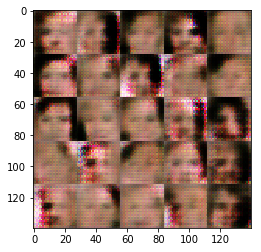

Epoch 1/5... Discriminator Loss: 1.7293... Generator Loss: 0.3377
Epoch 1/5... Discriminator Loss: 1.3081... Generator Loss: 2.8253
Epoch 1/5... Discriminator Loss: 1.4452... Generator Loss: 0.4009
Epoch 1/5... Discriminator Loss: 1.5567... Generator Loss: 2.4701
Epoch 1/5... Discriminator Loss: 1.1406... Generator Loss: 2.5245
Epoch 1/5... Discriminator Loss: 1.4562... Generator Loss: 0.9402
Epoch 1/5... Discriminator Loss: 0.9217... Generator Loss: 1.2516
Epoch 1/5... Discriminator Loss: 1.7130... Generator Loss: 1.6319
Epoch 1/5... Discriminator Loss: 1.4773... Generator Loss: 2.5195
Epoch 1/5... Discriminator Loss: 0.8042... Generator Loss: 0.9859
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


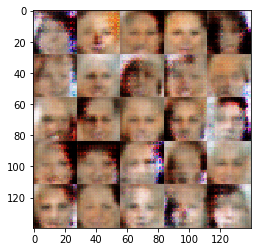

Epoch 1/5... Discriminator Loss: 1.1259... Generator Loss: 1.2994
Epoch 1/5... Discriminator Loss: 1.4154... Generator Loss: 0.5938
Epoch 1/5... Discriminator Loss: 1.3875... Generator Loss: 2.6220
Epoch 1/5... Discriminator Loss: 1.5017... Generator Loss: 0.8181
Epoch 1/5... Discriminator Loss: 1.1092... Generator Loss: 1.5520
Epoch 1/5... Discriminator Loss: 1.5749... Generator Loss: 2.3384
Epoch 1/5... Discriminator Loss: 1.1195... Generator Loss: 0.5756
Epoch 1/5... Discriminator Loss: 1.2656... Generator Loss: 0.6797
Epoch 1/5... Discriminator Loss: 1.7918... Generator Loss: 0.2494
Epoch 1/5... Discriminator Loss: 1.1177... Generator Loss: 0.9150
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


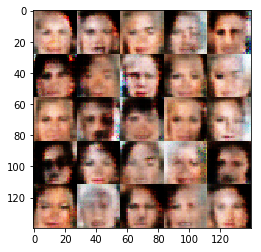

Epoch 1/5... Discriminator Loss: 1.2268... Generator Loss: 1.5043
Epoch 1/5... Discriminator Loss: 1.2392... Generator Loss: 0.5561
Epoch 1/5... Discriminator Loss: 1.7011... Generator Loss: 1.8755
Epoch 1/5... Discriminator Loss: 1.5162... Generator Loss: 3.5147
Epoch 1/5... Discriminator Loss: 2.5934... Generator Loss: 2.9261
Epoch 1/5... Discriminator Loss: 1.0734... Generator Loss: 0.6230
Epoch 1/5... Discriminator Loss: 1.2034... Generator Loss: 0.4712
Epoch 1/5... Discriminator Loss: 0.9182... Generator Loss: 2.7681
Epoch 1/5... Discriminator Loss: 1.7365... Generator Loss: 2.7420
Epoch 1/5... Discriminator Loss: 0.9183... Generator Loss: 0.8731
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


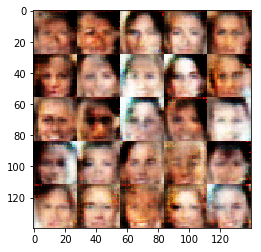

Epoch 1/5... Discriminator Loss: 1.1251... Generator Loss: 0.7126
Epoch 1/5... Discriminator Loss: 1.5665... Generator Loss: 0.3191
Epoch 1/5... Discriminator Loss: 1.5425... Generator Loss: 2.4444
Epoch 1/5... Discriminator Loss: 1.4933... Generator Loss: 0.4053
Epoch 1/5... Discriminator Loss: 0.7212... Generator Loss: 1.5408
Epoch 1/5... Discriminator Loss: 1.4759... Generator Loss: 0.4414
Epoch 1/5... Discriminator Loss: 2.0181... Generator Loss: 0.1950
Epoch 1/5... Discriminator Loss: 0.9929... Generator Loss: 0.6578
Epoch 1/5... Discriminator Loss: 1.3512... Generator Loss: 0.3967
Epoch 1/5... Discriminator Loss: 1.3531... Generator Loss: 0.4101
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


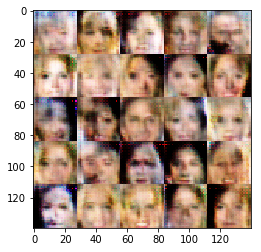

Epoch 1/5... Discriminator Loss: 1.3492... Generator Loss: 0.8942
Epoch 1/5... Discriminator Loss: 1.4776... Generator Loss: 0.4121
Epoch 1/5... Discriminator Loss: 1.5684... Generator Loss: 2.6873
Epoch 1/5... Discriminator Loss: 1.5911... Generator Loss: 0.3037
Epoch 1/5... Discriminator Loss: 1.1543... Generator Loss: 2.1841
Epoch 1/5... Discriminator Loss: 1.0535... Generator Loss: 0.7481
Epoch 1/5... Discriminator Loss: 0.5336... Generator Loss: 1.8824
Epoch 1/5... Discriminator Loss: 2.4134... Generator Loss: 0.1222
Epoch 1/5... Discriminator Loss: 1.3395... Generator Loss: 1.6369
Epoch 1/5... Discriminator Loss: 0.8859... Generator Loss: 1.7169
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


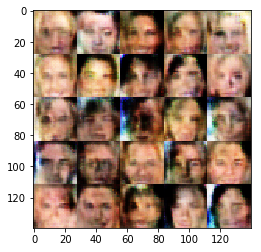

Epoch 1/5... Discriminator Loss: 0.9271... Generator Loss: 1.3111
Epoch 1/5... Discriminator Loss: 0.9847... Generator Loss: 1.2012
Epoch 1/5... Discriminator Loss: 1.1357... Generator Loss: 0.9972
Epoch 1/5... Discriminator Loss: 0.9558... Generator Loss: 1.0042
Epoch 1/5... Discriminator Loss: 0.6025... Generator Loss: 1.6658
Epoch 1/5... Discriminator Loss: 1.4083... Generator Loss: 0.4479
Epoch 1/5... Discriminator Loss: 1.5829... Generator Loss: 2.6158
Epoch 1/5... Discriminator Loss: 0.9787... Generator Loss: 2.2423
Epoch 1/5... Discriminator Loss: 1.0697... Generator Loss: 1.1132
Epoch 1/5... Discriminator Loss: 1.1704... Generator Loss: 0.5625
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


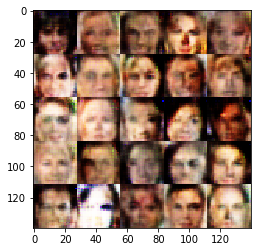

Epoch 1/5... Discriminator Loss: 1.2935... Generator Loss: 2.1010
Epoch 1/5... Discriminator Loss: 0.8902... Generator Loss: 1.9325
Epoch 1/5... Discriminator Loss: 0.9962... Generator Loss: 1.0060
Epoch 1/5... Discriminator Loss: 1.5895... Generator Loss: 0.2878
Epoch 1/5... Discriminator Loss: 1.3510... Generator Loss: 1.4281
Epoch 1/5... Discriminator Loss: 0.9831... Generator Loss: 0.8496
Epoch 1/5... Discriminator Loss: 1.2728... Generator Loss: 3.0288
Epoch 1/5... Discriminator Loss: 1.7336... Generator Loss: 0.3684
Epoch 1/5... Discriminator Loss: 0.7864... Generator Loss: 0.9755
Epoch 1/5... Discriminator Loss: 0.3294... Generator Loss: 2.4198
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


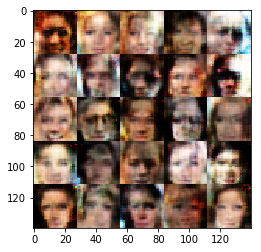

Epoch 1/5... Discriminator Loss: 2.8199... Generator Loss: 4.1686
Epoch 1/5... Discriminator Loss: 1.1534... Generator Loss: 3.4907
Epoch 1/5... Discriminator Loss: 0.6662... Generator Loss: 2.2113
Epoch 1/5... Discriminator Loss: 0.9289... Generator Loss: 0.7878
Epoch 1/5... Discriminator Loss: 0.9824... Generator Loss: 1.4561
Epoch 1/5... Discriminator Loss: 0.5535... Generator Loss: 1.8862
Epoch 1/5... Discriminator Loss: 0.7992... Generator Loss: 1.6071
Epoch 1/5... Discriminator Loss: 0.5139... Generator Loss: 2.3492
Epoch 1/5... Discriminator Loss: 0.6282... Generator Loss: 1.6527
Epoch 1/5... Discriminator Loss: 0.9293... Generator Loss: 1.0867
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


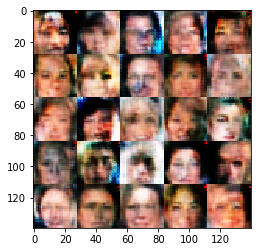

Epoch 1/5... Discriminator Loss: 1.2467... Generator Loss: 0.8509
Epoch 1/5... Discriminator Loss: 1.4346... Generator Loss: 0.4181
Epoch 1/5... Discriminator Loss: 1.0737... Generator Loss: 0.8510
Epoch 1/5... Discriminator Loss: 0.9684... Generator Loss: 1.0832
Epoch 1/5... Discriminator Loss: 1.5005... Generator Loss: 0.3829
Epoch 1/5... Discriminator Loss: 1.6527... Generator Loss: 0.3041
Epoch 1/5... Discriminator Loss: 1.0540... Generator Loss: 2.7848
Epoch 1/5... Discriminator Loss: 0.7195... Generator Loss: 1.9736
Epoch 1/5... Discriminator Loss: 1.3829... Generator Loss: 0.4709
Epoch 1/5... Discriminator Loss: 0.9851... Generator Loss: 1.3498
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


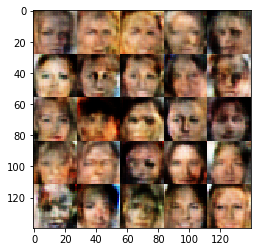

Epoch 1/5... Discriminator Loss: 0.6908... Generator Loss: 1.2820
Epoch 1/5... Discriminator Loss: 2.4187... Generator Loss: 2.3628
Epoch 1/5... Discriminator Loss: 1.1367... Generator Loss: 1.2288
Epoch 1/5... Discriminator Loss: 1.1527... Generator Loss: 0.5564
Epoch 1/5... Discriminator Loss: 0.9703... Generator Loss: 1.3352
Epoch 1/5... Discriminator Loss: 0.6920... Generator Loss: 1.5562
Epoch 1/5... Discriminator Loss: 1.1182... Generator Loss: 1.5361
Epoch 1/5... Discriminator Loss: 1.2339... Generator Loss: 2.9904
Epoch 1/5... Discriminator Loss: 1.0714... Generator Loss: 0.7618
Epoch 1/5... Discriminator Loss: 1.1914... Generator Loss: 0.7864
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


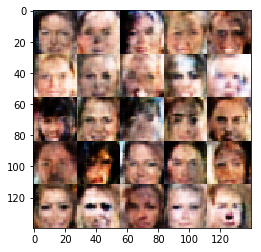

Epoch 1/5... Discriminator Loss: 1.3018... Generator Loss: 0.9331
Epoch 1/5... Discriminator Loss: 1.2296... Generator Loss: 1.5759
Epoch 1/5... Discriminator Loss: 1.4501... Generator Loss: 0.4079
Epoch 1/5... Discriminator Loss: 0.5987... Generator Loss: 1.1340
Epoch 1/5... Discriminator Loss: 0.3588... Generator Loss: 2.2046
Epoch 1/5... Discriminator Loss: 0.2997... Generator Loss: 2.4347
Epoch 1/5... Discriminator Loss: 0.1551... Generator Loss: 3.7271
Epoch 1/5... Discriminator Loss: 0.2003... Generator Loss: 2.4346
Epoch 1/5... Discriminator Loss: 1.0706... Generator Loss: 1.1042
Epoch 1/5... Discriminator Loss: 0.6132... Generator Loss: 2.0654
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


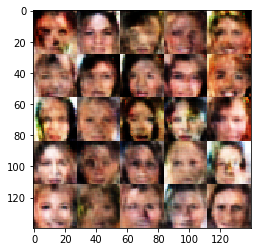

Epoch 1/5... Discriminator Loss: 1.2423... Generator Loss: 0.5043
Epoch 1/5... Discriminator Loss: 2.0551... Generator Loss: 1.2043
Epoch 1/5... Discriminator Loss: 1.1886... Generator Loss: 0.5357
Epoch 1/5... Discriminator Loss: 1.0103... Generator Loss: 1.5674
Epoch 1/5... Discriminator Loss: 0.8781... Generator Loss: 0.7655
Epoch 1/5... Discriminator Loss: 1.1170... Generator Loss: 1.2114
Epoch 1/5... Discriminator Loss: 0.8652... Generator Loss: 1.0056
Epoch 1/5... Discriminator Loss: 1.4572... Generator Loss: 1.6084
Epoch 1/5... Discriminator Loss: 1.5801... Generator Loss: 0.4096
Epoch 1/5... Discriminator Loss: 1.0870... Generator Loss: 1.6624
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


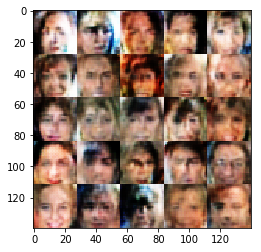

Epoch 1/5... Discriminator Loss: 1.1466... Generator Loss: 1.0511
Epoch 1/5... Discriminator Loss: 1.2951... Generator Loss: 0.5432
Epoch 1/5... Discriminator Loss: 1.2066... Generator Loss: 1.5331
Epoch 1/5... Discriminator Loss: 1.8006... Generator Loss: 0.2574
Epoch 1/5... Discriminator Loss: 1.2633... Generator Loss: 0.4475
Epoch 1/5... Discriminator Loss: 0.5667... Generator Loss: 1.9140
Epoch 1/5... Discriminator Loss: 2.2263... Generator Loss: 3.6084
Epoch 1/5... Discriminator Loss: 1.1812... Generator Loss: 0.5045
Epoch 1/5... Discriminator Loss: 1.5925... Generator Loss: 1.2519
Epoch 1/5... Discriminator Loss: 0.8617... Generator Loss: 1.1721
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


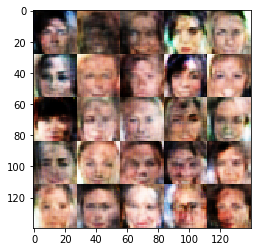

Epoch 1/5... Discriminator Loss: 0.7267... Generator Loss: 1.1489
Epoch 1/5... Discriminator Loss: 0.9869... Generator Loss: 0.6927
Epoch 1/5... Discriminator Loss: 0.6786... Generator Loss: 1.0198
Epoch 1/5... Discriminator Loss: 1.5030... Generator Loss: 0.3819
Epoch 1/5... Discriminator Loss: 0.9501... Generator Loss: 0.9655
Epoch 1/5... Discriminator Loss: 1.3166... Generator Loss: 0.3987
Epoch 1/5... Discriminator Loss: 1.4986... Generator Loss: 0.5269
Epoch 1/5... Discriminator Loss: 1.0665... Generator Loss: 0.7538
Epoch 1/5... Discriminator Loss: 1.0496... Generator Loss: 1.3121
Epoch 1/5... Discriminator Loss: 1.5163... Generator Loss: 0.3414
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


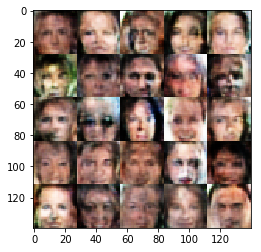

Epoch 1/5... Discriminator Loss: 0.8110... Generator Loss: 1.3586
Epoch 1/5... Discriminator Loss: 1.3953... Generator Loss: 0.4036
Epoch 1/5... Discriminator Loss: 1.0873... Generator Loss: 1.1669
Epoch 1/5... Discriminator Loss: 1.2260... Generator Loss: 0.5232
Epoch 1/5... Discriminator Loss: 1.0088... Generator Loss: 0.8691
Epoch 1/5... Discriminator Loss: 0.7286... Generator Loss: 1.1625
Epoch 1/5... Discriminator Loss: 1.0993... Generator Loss: 0.5999
Epoch 1/5... Discriminator Loss: 1.1391... Generator Loss: 0.5853
Epoch 1/5... Discriminator Loss: 1.4271... Generator Loss: 0.3547
Epoch 1/5... Discriminator Loss: 0.9033... Generator Loss: 1.4282
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


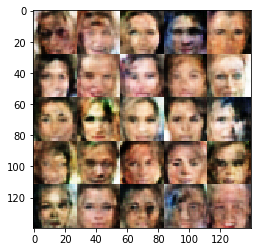

Epoch 1/5... Discriminator Loss: 1.3310... Generator Loss: 0.4451
Epoch 1/5... Discriminator Loss: 1.3204... Generator Loss: 1.2494
Epoch 1/5... Discriminator Loss: 1.2763... Generator Loss: 0.4666
Epoch 1/5... Discriminator Loss: 1.3373... Generator Loss: 0.4686
Epoch 1/5... Discriminator Loss: 0.9480... Generator Loss: 0.7714
Epoch 1/5... Discriminator Loss: 2.0315... Generator Loss: 0.2099
Epoch 1/5... Discriminator Loss: 0.5767... Generator Loss: 3.2786
Epoch 1/5... Discriminator Loss: 1.1302... Generator Loss: 0.5613
Epoch 1/5... Discriminator Loss: 0.7446... Generator Loss: 1.5659
Epoch 1/5... Discriminator Loss: 1.0885... Generator Loss: 0.5837
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


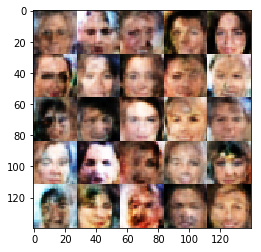

Epoch 1/5... Discriminator Loss: 1.6436... Generator Loss: 1.9819
Epoch 1/5... Discriminator Loss: 1.0032... Generator Loss: 1.3351
Epoch 1/5... Discriminator Loss: 1.3985... Generator Loss: 0.4285
Epoch 1/5... Discriminator Loss: 0.8371... Generator Loss: 1.0376
Epoch 1/5... Discriminator Loss: 1.4084... Generator Loss: 1.2693
Epoch 1/5... Discriminator Loss: 1.0409... Generator Loss: 0.8529
Epoch 1/5... Discriminator Loss: 1.1917... Generator Loss: 0.5660
Epoch 1/5... Discriminator Loss: 1.4316... Generator Loss: 0.3518
Epoch 1/5... Discriminator Loss: 1.1191... Generator Loss: 1.2844
Epoch 1/5... Discriminator Loss: 0.8751... Generator Loss: 1.6199
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


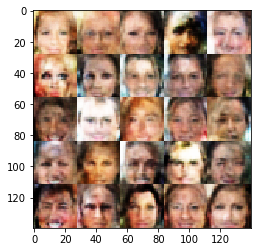

Epoch 1/5... Discriminator Loss: 1.0065... Generator Loss: 0.9093
Epoch 1/5... Discriminator Loss: 1.1963... Generator Loss: 0.5226
Epoch 1/5... Discriminator Loss: 1.1076... Generator Loss: 1.2934
Epoch 1/5... Discriminator Loss: 0.8428... Generator Loss: 0.9862
Epoch 1/5... Discriminator Loss: 1.3324... Generator Loss: 1.5283
Epoch 1/5... Discriminator Loss: 1.6508... Generator Loss: 0.4003
Epoch 1/5... Discriminator Loss: 1.0642... Generator Loss: 0.8362
Epoch 1/5... Discriminator Loss: 0.9334... Generator Loss: 1.1144
Epoch 1/5... Discriminator Loss: 1.1636... Generator Loss: 1.1127
Epoch 1/5... Discriminator Loss: 0.8803... Generator Loss: 1.8387
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


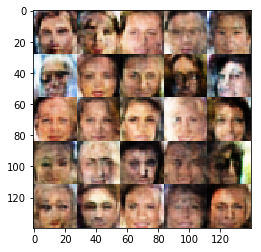

Epoch 1/5... Discriminator Loss: 1.7108... Generator Loss: 0.2736
Epoch 1/5... Discriminator Loss: 0.8503... Generator Loss: 0.9285
Epoch 1/5... Discriminator Loss: 1.3638... Generator Loss: 1.7401
Epoch 1/5... Discriminator Loss: 0.9752... Generator Loss: 1.2699
Epoch 1/5... Discriminator Loss: 0.5789... Generator Loss: 1.9279
Epoch 1/5... Discriminator Loss: 0.7568... Generator Loss: 1.1260
Epoch 1/5... Discriminator Loss: 0.6911... Generator Loss: 1.6078
Epoch 1/5... Discriminator Loss: 0.8039... Generator Loss: 0.8399
Epoch 1/5... Discriminator Loss: 1.0230... Generator Loss: 0.7138
Epoch 1/5... Discriminator Loss: 1.6545... Generator Loss: 2.2621
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


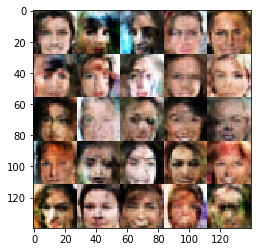

Epoch 1/5... Discriminator Loss: 0.6057... Generator Loss: 1.7636
Epoch 1/5... Discriminator Loss: 0.4810... Generator Loss: 2.4068
Epoch 1/5... Discriminator Loss: 0.8168... Generator Loss: 2.6081
Epoch 1/5... Discriminator Loss: 0.7778... Generator Loss: 1.7400
Epoch 1/5... Discriminator Loss: 1.3321... Generator Loss: 0.8270
Epoch 1/5... Discriminator Loss: 0.8593... Generator Loss: 1.9941
Epoch 1/5... Discriminator Loss: 1.0706... Generator Loss: 0.6725
Epoch 1/5... Discriminator Loss: 0.5354... Generator Loss: 1.8065
Epoch 1/5... Discriminator Loss: 0.8769... Generator Loss: 0.8615
Epoch 1/5... Discriminator Loss: 1.0587... Generator Loss: 1.5726
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


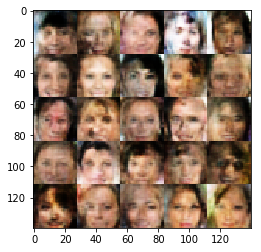

Epoch 1/5... Discriminator Loss: 0.9835... Generator Loss: 1.3595
Epoch 1/5... Discriminator Loss: 0.7165... Generator Loss: 1.0380
Epoch 1/5... Discriminator Loss: 0.6037... Generator Loss: 1.4170
Epoch 1/5... Discriminator Loss: 1.1973... Generator Loss: 1.4541
Epoch 1/5... Discriminator Loss: 1.1144... Generator Loss: 0.5744
Epoch 1/5... Discriminator Loss: 0.5633... Generator Loss: 1.8116
Epoch 1/5... Discriminator Loss: 0.9533... Generator Loss: 1.0288
Epoch 1/5... Discriminator Loss: 0.8807... Generator Loss: 0.8936
Epoch 1/5... Discriminator Loss: 1.1033... Generator Loss: 0.6001
Epoch 1/5... Discriminator Loss: 0.5254... Generator Loss: 1.8596
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


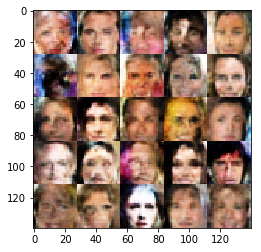

Epoch 1/5... Discriminator Loss: 0.6692... Generator Loss: 1.3306
Epoch 1/5... Discriminator Loss: 0.4815... Generator Loss: 1.5131
Epoch 1/5... Discriminator Loss: 1.4774... Generator Loss: 1.7546
Epoch 1/5... Discriminator Loss: 1.3547... Generator Loss: 1.5434
Epoch 1/5... Discriminator Loss: 0.8723... Generator Loss: 0.9621
Epoch 1/5... Discriminator Loss: 0.6598... Generator Loss: 1.6245
Epoch 1/5... Discriminator Loss: 1.0721... Generator Loss: 1.4489
Epoch 1/5... Discriminator Loss: 0.6840... Generator Loss: 1.5519
Epoch 1/5... Discriminator Loss: 1.1680... Generator Loss: 1.6179
Epoch 1/5... Discriminator Loss: 1.2477... Generator Loss: 1.1756
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


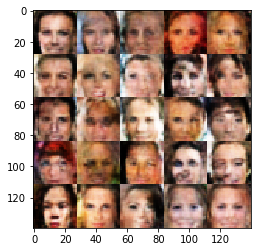

Epoch 1/5... Discriminator Loss: 1.5348... Generator Loss: 0.3680
Epoch 1/5... Discriminator Loss: 0.6631... Generator Loss: 1.1494
Epoch 1/5... Discriminator Loss: 0.6275... Generator Loss: 1.5734
Epoch 1/5... Discriminator Loss: 2.5897... Generator Loss: 0.1164
Epoch 1/5... Discriminator Loss: 1.0589... Generator Loss: 0.6799
Epoch 1/5... Discriminator Loss: 0.8256... Generator Loss: 1.7041
Epoch 1/5... Discriminator Loss: 1.1330... Generator Loss: 2.7052
Epoch 1/5... Discriminator Loss: 1.0915... Generator Loss: 0.5889
Epoch 1/5... Discriminator Loss: 0.9841... Generator Loss: 1.1010
Epoch 1/5... Discriminator Loss: 1.3228... Generator Loss: 0.4495
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


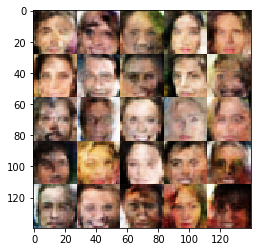

Epoch 1/5... Discriminator Loss: 0.9337... Generator Loss: 1.0061
Epoch 1/5... Discriminator Loss: 0.8659... Generator Loss: 0.9382
Epoch 1/5... Discriminator Loss: 0.8112... Generator Loss: 0.9104
Epoch 1/5... Discriminator Loss: 1.5224... Generator Loss: 0.3109
Epoch 1/5... Discriminator Loss: 1.0110... Generator Loss: 1.0489
Epoch 1/5... Discriminator Loss: 2.0232... Generator Loss: 2.0797
Epoch 1/5... Discriminator Loss: 1.0318... Generator Loss: 0.8456
Epoch 1/5... Discriminator Loss: 0.9022... Generator Loss: 0.7341
Epoch 1/5... Discriminator Loss: 0.8859... Generator Loss: 1.0617
Epoch 1/5... Discriminator Loss: 1.0585... Generator Loss: 0.6184
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


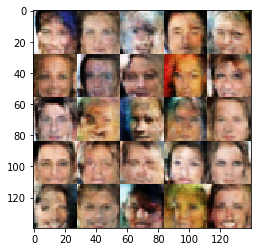

Epoch 1/5... Discriminator Loss: 0.6813... Generator Loss: 2.7486
Epoch 1/5... Discriminator Loss: 0.6867... Generator Loss: 1.2033
Epoch 1/5... Discriminator Loss: 1.7842... Generator Loss: 0.2390
Epoch 1/5... Discriminator Loss: 0.9163... Generator Loss: 2.0121
Epoch 1/5... Discriminator Loss: 0.7752... Generator Loss: 1.6472
Epoch 1/5... Discriminator Loss: 1.4855... Generator Loss: 0.7023
Epoch 1/5... Discriminator Loss: 1.1746... Generator Loss: 0.6355
Epoch 1/5... Discriminator Loss: 1.0350... Generator Loss: 0.7860
Epoch 1/5... Discriminator Loss: 0.6845... Generator Loss: 1.4360
Epoch 1/5... Discriminator Loss: 0.7055... Generator Loss: 1.0715
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


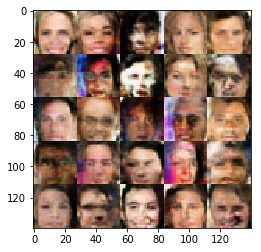

Epoch 1/5... Discriminator Loss: 0.9605... Generator Loss: 0.7608
Epoch 1/5... Discriminator Loss: 0.6103... Generator Loss: 2.3860
Epoch 1/5... Discriminator Loss: 1.0252... Generator Loss: 0.7331
Epoch 1/5... Discriminator Loss: 0.6510... Generator Loss: 1.6428
Epoch 1/5... Discriminator Loss: 1.3513... Generator Loss: 0.5285
Epoch 1/5... Discriminator Loss: 0.4907... Generator Loss: 1.8365
Epoch 1/5... Discriminator Loss: 0.9235... Generator Loss: 1.1628
Epoch 1/5... Discriminator Loss: 0.6832... Generator Loss: 1.6447
Epoch 1/5... Discriminator Loss: 1.3348... Generator Loss: 0.4113
Epoch 1/5... Discriminator Loss: 0.8716... Generator Loss: 0.9394
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


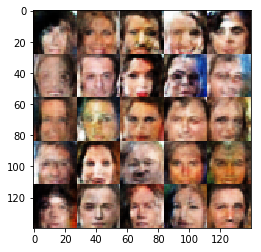

Epoch 1/5... Discriminator Loss: 0.9141... Generator Loss: 1.9693
Epoch 1/5... Discriminator Loss: 0.5105... Generator Loss: 1.6108
Epoch 1/5... Discriminator Loss: 2.9814... Generator Loss: 0.3648
Epoch 1/5... Discriminator Loss: 1.2808... Generator Loss: 0.7675
Epoch 1/5... Discriminator Loss: 1.2062... Generator Loss: 0.5604
Epoch 1/5... Discriminator Loss: 0.8633... Generator Loss: 1.1434
Epoch 1/5... Discriminator Loss: 0.9011... Generator Loss: 0.8471
Epoch 1/5... Discriminator Loss: 1.2199... Generator Loss: 0.5273
Epoch 1/5... Discriminator Loss: 0.9269... Generator Loss: 1.4498
Epoch 1/5... Discriminator Loss: 0.9597... Generator Loss: 1.3451
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


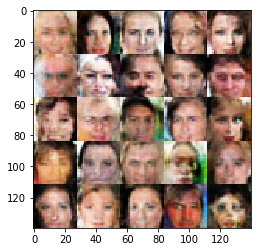

Epoch 1/5... Discriminator Loss: 0.8127... Generator Loss: 0.7953
Epoch 1/5... Discriminator Loss: 0.7618... Generator Loss: 1.5174
Epoch 1/5... Discriminator Loss: 1.0575... Generator Loss: 1.6880
Epoch 1/5... Discriminator Loss: 0.5832... Generator Loss: 1.7243
Epoch 1/5... Discriminator Loss: 0.6115... Generator Loss: 2.0312
Epoch 1/5... Discriminator Loss: 1.0910... Generator Loss: 0.7311
Epoch 1/5... Discriminator Loss: 0.9522... Generator Loss: 1.3818
Epoch 1/5... Discriminator Loss: 0.8953... Generator Loss: 1.4921
Epoch 1/5... Discriminator Loss: 1.0089... Generator Loss: 1.6801
Epoch 1/5... Discriminator Loss: 1.4319... Generator Loss: 1.8232
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


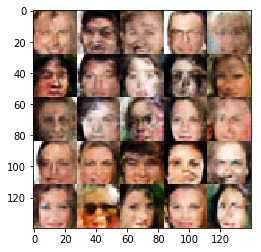

Epoch 1/5... Discriminator Loss: 0.8245... Generator Loss: 1.2930
Epoch 1/5... Discriminator Loss: 1.0521... Generator Loss: 1.7690
Epoch 1/5... Discriminator Loss: 0.7320... Generator Loss: 1.6979
Epoch 1/5... Discriminator Loss: 1.0019... Generator Loss: 1.3957
Epoch 1/5... Discriminator Loss: 0.6248... Generator Loss: 1.1753
Epoch 1/5... Discriminator Loss: 1.0280... Generator Loss: 1.3132
Epoch 1/5... Discriminator Loss: 1.0134... Generator Loss: 2.0059
Epoch 1/5... Discriminator Loss: 1.3380... Generator Loss: 1.9505
Epoch 1/5... Discriminator Loss: 0.7301... Generator Loss: 1.2713
Epoch 1/5... Discriminator Loss: 1.5078... Generator Loss: 0.3980
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


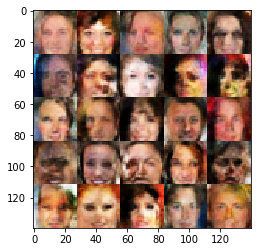

Epoch 1/5... Discriminator Loss: 0.8417... Generator Loss: 1.0286
Epoch 1/5... Discriminator Loss: 1.2742... Generator Loss: 0.5486
Epoch 1/5... Discriminator Loss: 1.0620... Generator Loss: 0.7480
Epoch 1/5... Discriminator Loss: 1.2290... Generator Loss: 0.5213
Epoch 1/5... Discriminator Loss: 1.0291... Generator Loss: 1.8903
Epoch 1/5... Discriminator Loss: 0.5641... Generator Loss: 2.4556
Epoch 1/5... Discriminator Loss: 0.6180... Generator Loss: 1.1622
Epoch 1/5... Discriminator Loss: 0.6646... Generator Loss: 1.1049
Epoch 1/5... Discriminator Loss: 0.9512... Generator Loss: 1.4054
Epoch 1/5... Discriminator Loss: 1.8354... Generator Loss: 0.3549
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


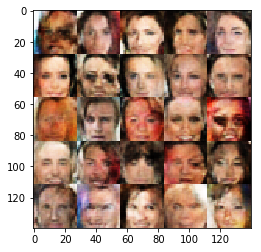

Epoch 1/5... Discriminator Loss: 0.4979... Generator Loss: 2.2508
Epoch 1/5... Discriminator Loss: 0.8428... Generator Loss: 1.8412
Epoch 1/5... Discriminator Loss: 1.0277... Generator Loss: 0.7438
Epoch 1/5... Discriminator Loss: 1.3058... Generator Loss: 0.4565
Epoch 1/5... Discriminator Loss: 0.7950... Generator Loss: 2.3475
Epoch 1/5... Discriminator Loss: 0.7113... Generator Loss: 0.9945
Epoch 2/5... Discriminator Loss: 0.7391... Generator Loss: 1.1743
Epoch 2/5... Discriminator Loss: 1.7105... Generator Loss: 0.2946
Epoch 2/5... Discriminator Loss: 0.8913... Generator Loss: 0.8076
Epoch 2/5... Discriminator Loss: 0.5281... Generator Loss: 1.6195
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


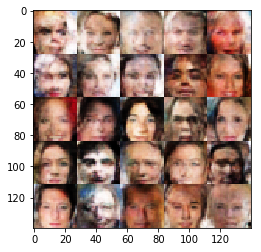

Epoch 2/5... Discriminator Loss: 0.9864... Generator Loss: 0.6585
Epoch 2/5... Discriminator Loss: 0.8518... Generator Loss: 0.8004
Epoch 2/5... Discriminator Loss: 0.8597... Generator Loss: 1.6875
Epoch 2/5... Discriminator Loss: 0.3858... Generator Loss: 2.4143
Epoch 2/5... Discriminator Loss: 0.8303... Generator Loss: 3.0063
Epoch 2/5... Discriminator Loss: 0.7004... Generator Loss: 1.3325
Epoch 2/5... Discriminator Loss: 0.6238... Generator Loss: 2.1547
Epoch 2/5... Discriminator Loss: 0.7219... Generator Loss: 1.0525
Epoch 2/5... Discriminator Loss: 1.2688... Generator Loss: 0.5862
Epoch 2/5... Discriminator Loss: 1.1088... Generator Loss: 0.6349
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


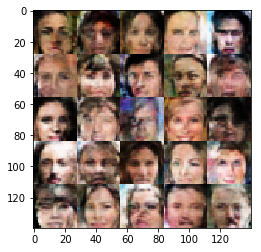

Epoch 2/5... Discriminator Loss: 0.8257... Generator Loss: 1.1640
Epoch 2/5... Discriminator Loss: 1.3129... Generator Loss: 1.3692
Epoch 2/5... Discriminator Loss: 0.7581... Generator Loss: 1.2742
Epoch 2/5... Discriminator Loss: 0.7926... Generator Loss: 1.6656
Epoch 2/5... Discriminator Loss: 1.0047... Generator Loss: 0.6554
Epoch 2/5... Discriminator Loss: 1.8032... Generator Loss: 0.2888
Epoch 2/5... Discriminator Loss: 1.0232... Generator Loss: 1.7375
Epoch 2/5... Discriminator Loss: 0.9889... Generator Loss: 0.9025
Epoch 2/5... Discriminator Loss: 0.8047... Generator Loss: 1.4666
Epoch 2/5... Discriminator Loss: 0.7701... Generator Loss: 1.3194
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


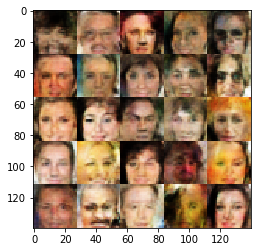

Epoch 2/5... Discriminator Loss: 0.5742... Generator Loss: 1.5780
Epoch 2/5... Discriminator Loss: 2.5228... Generator Loss: 0.1132
Epoch 2/5... Discriminator Loss: 0.6572... Generator Loss: 1.2697
Epoch 2/5... Discriminator Loss: 0.6754... Generator Loss: 1.2319
Epoch 2/5... Discriminator Loss: 1.5823... Generator Loss: 0.3244
Epoch 2/5... Discriminator Loss: 0.9541... Generator Loss: 0.7615
Epoch 2/5... Discriminator Loss: 0.7442... Generator Loss: 2.4333
Epoch 2/5... Discriminator Loss: 0.6619... Generator Loss: 1.5946
Epoch 2/5... Discriminator Loss: 1.0819... Generator Loss: 3.6260
Epoch 2/5... Discriminator Loss: 0.5951... Generator Loss: 1.2505
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


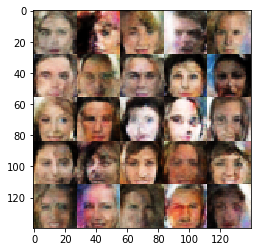

Epoch 2/5... Discriminator Loss: 1.6514... Generator Loss: 0.2922
Epoch 2/5... Discriminator Loss: 0.7451... Generator Loss: 1.1006
Epoch 2/5... Discriminator Loss: 1.7165... Generator Loss: 2.5077
Epoch 2/5... Discriminator Loss: 1.2328... Generator Loss: 0.6643
Epoch 2/5... Discriminator Loss: 0.4798... Generator Loss: 2.3616
Epoch 2/5... Discriminator Loss: 0.5805... Generator Loss: 2.0024
Epoch 2/5... Discriminator Loss: 0.6135... Generator Loss: 1.6046
Epoch 2/5... Discriminator Loss: 0.7629... Generator Loss: 1.1071
Epoch 2/5... Discriminator Loss: 0.9791... Generator Loss: 0.6896
Epoch 2/5... Discriminator Loss: 1.1141... Generator Loss: 0.6382
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


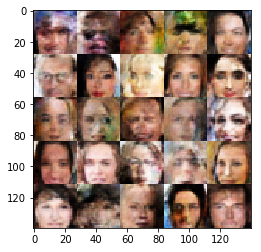

Epoch 2/5... Discriminator Loss: 1.8160... Generator Loss: 0.4070
Epoch 2/5... Discriminator Loss: 0.9794... Generator Loss: 0.7963
Epoch 2/5... Discriminator Loss: 1.0917... Generator Loss: 0.6179
Epoch 2/5... Discriminator Loss: 0.7273... Generator Loss: 1.1650
Epoch 2/5... Discriminator Loss: 1.1588... Generator Loss: 1.8385
Epoch 2/5... Discriminator Loss: 0.7982... Generator Loss: 1.2760
Epoch 2/5... Discriminator Loss: 0.6957... Generator Loss: 1.1700
Epoch 2/5... Discriminator Loss: 1.1372... Generator Loss: 0.5792
Epoch 2/5... Discriminator Loss: 1.0283... Generator Loss: 1.9337
Epoch 2/5... Discriminator Loss: 0.7604... Generator Loss: 1.2199
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


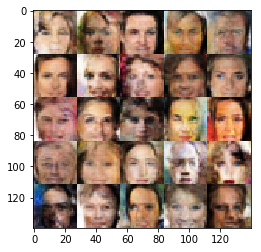

Epoch 2/5... Discriminator Loss: 0.4678... Generator Loss: 1.8631
Epoch 2/5... Discriminator Loss: 0.5560... Generator Loss: 1.4366
Epoch 2/5... Discriminator Loss: 0.6665... Generator Loss: 1.0811
Epoch 2/5... Discriminator Loss: 0.7059... Generator Loss: 1.2668
Epoch 2/5... Discriminator Loss: 1.6907... Generator Loss: 0.2493
Epoch 2/5... Discriminator Loss: 1.7867... Generator Loss: 0.3557
Epoch 2/5... Discriminator Loss: 2.2807... Generator Loss: 2.8236
Epoch 2/5... Discriminator Loss: 1.8808... Generator Loss: 0.2482
Epoch 2/5... Discriminator Loss: 0.9907... Generator Loss: 0.8170
Epoch 2/5... Discriminator Loss: 0.9893... Generator Loss: 0.6363
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


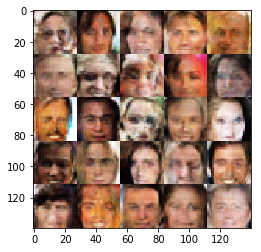

Epoch 2/5... Discriminator Loss: 1.1718... Generator Loss: 1.6476
Epoch 2/5... Discriminator Loss: 0.6328... Generator Loss: 1.3943
Epoch 2/5... Discriminator Loss: 0.5130... Generator Loss: 1.5058
Epoch 2/5... Discriminator Loss: 0.6361... Generator Loss: 1.9223
Epoch 2/5... Discriminator Loss: 0.9816... Generator Loss: 0.7280
Epoch 2/5... Discriminator Loss: 0.7283... Generator Loss: 1.1173
Epoch 2/5... Discriminator Loss: 1.8307... Generator Loss: 0.2379
Epoch 2/5... Discriminator Loss: 1.1005... Generator Loss: 1.9276
Epoch 2/5... Discriminator Loss: 0.5712... Generator Loss: 1.8075
Epoch 2/5... Discriminator Loss: 0.7570... Generator Loss: 2.1703
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


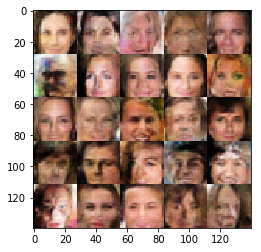

Epoch 2/5... Discriminator Loss: 0.4641... Generator Loss: 1.5513
Epoch 2/5... Discriminator Loss: 1.2649... Generator Loss: 1.2782
Epoch 2/5... Discriminator Loss: 0.8725... Generator Loss: 0.7679
Epoch 2/5... Discriminator Loss: 0.4656... Generator Loss: 1.7825
Epoch 2/5... Discriminator Loss: 0.8060... Generator Loss: 2.0652
Epoch 2/5... Discriminator Loss: 0.9577... Generator Loss: 0.7052
Epoch 2/5... Discriminator Loss: 0.7764... Generator Loss: 2.9061
Epoch 2/5... Discriminator Loss: 0.8961... Generator Loss: 1.0750
Epoch 2/5... Discriminator Loss: 0.4831... Generator Loss: 1.6191
Epoch 2/5... Discriminator Loss: 1.5724... Generator Loss: 0.3691
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


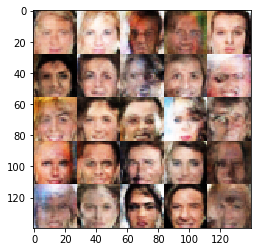

Epoch 2/5... Discriminator Loss: 0.6169... Generator Loss: 1.2203
Epoch 2/5... Discriminator Loss: 0.8556... Generator Loss: 1.1581
Epoch 2/5... Discriminator Loss: 0.3436... Generator Loss: 2.8299
Epoch 2/5... Discriminator Loss: 0.6081... Generator Loss: 1.2576
Epoch 2/5... Discriminator Loss: 1.0285... Generator Loss: 0.5877
Epoch 2/5... Discriminator Loss: 0.9171... Generator Loss: 1.1428
Epoch 2/5... Discriminator Loss: 2.4140... Generator Loss: 0.1823
Epoch 2/5... Discriminator Loss: 1.0152... Generator Loss: 1.0112
Epoch 2/5... Discriminator Loss: 0.5497... Generator Loss: 1.8919
Epoch 2/5... Discriminator Loss: 1.0468... Generator Loss: 0.6616
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


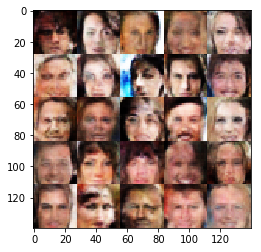

Epoch 2/5... Discriminator Loss: 0.9241... Generator Loss: 1.0311
Epoch 2/5... Discriminator Loss: 0.8919... Generator Loss: 0.9097
Epoch 2/5... Discriminator Loss: 0.4203... Generator Loss: 2.3433
Epoch 2/5... Discriminator Loss: 1.2674... Generator Loss: 0.5471
Epoch 2/5... Discriminator Loss: 0.6107... Generator Loss: 1.3814
Epoch 2/5... Discriminator Loss: 0.3961... Generator Loss: 1.9908
Epoch 2/5... Discriminator Loss: 0.5509... Generator Loss: 1.2591
Epoch 2/5... Discriminator Loss: 1.5894... Generator Loss: 2.4656
Epoch 2/5... Discriminator Loss: 0.7608... Generator Loss: 1.7966
Epoch 2/5... Discriminator Loss: 0.9074... Generator Loss: 1.1130
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


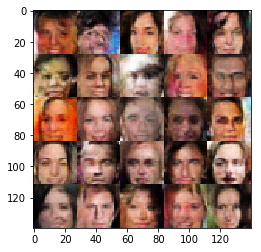

Epoch 2/5... Discriminator Loss: 0.7842... Generator Loss: 2.2579
Epoch 2/5... Discriminator Loss: 0.7141... Generator Loss: 2.2074
Epoch 2/5... Discriminator Loss: 0.5105... Generator Loss: 1.6296
Epoch 2/5... Discriminator Loss: 0.7674... Generator Loss: 1.0809
Epoch 2/5... Discriminator Loss: 1.2115... Generator Loss: 1.4524
Epoch 2/5... Discriminator Loss: 0.6518... Generator Loss: 1.3800
Epoch 2/5... Discriminator Loss: 1.0882... Generator Loss: 2.7801
Epoch 2/5... Discriminator Loss: 0.6012... Generator Loss: 1.3847
Epoch 2/5... Discriminator Loss: 0.6393... Generator Loss: 1.4327
Epoch 2/5... Discriminator Loss: 0.5625... Generator Loss: 2.0032
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


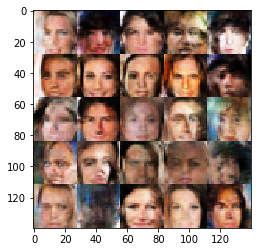

Epoch 2/5... Discriminator Loss: 1.4678... Generator Loss: 1.7263
Epoch 2/5... Discriminator Loss: 0.6829... Generator Loss: 1.7233
Epoch 2/5... Discriminator Loss: 0.8614... Generator Loss: 0.8673
Epoch 2/5... Discriminator Loss: 0.5840... Generator Loss: 1.5098
Epoch 2/5... Discriminator Loss: 1.9005... Generator Loss: 0.2445
Epoch 2/5... Discriminator Loss: 1.8842... Generator Loss: 0.2614
Epoch 2/5... Discriminator Loss: 0.9005... Generator Loss: 1.8420
Epoch 2/5... Discriminator Loss: 0.9323... Generator Loss: 1.5832
Epoch 2/5... Discriminator Loss: 0.7583... Generator Loss: 1.2389
Epoch 2/5... Discriminator Loss: 0.7072... Generator Loss: 0.9785
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


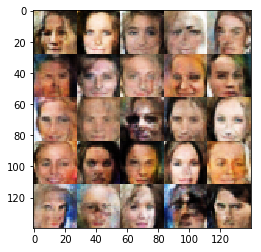

Epoch 2/5... Discriminator Loss: 0.6986... Generator Loss: 2.1757
Epoch 2/5... Discriminator Loss: 1.3932... Generator Loss: 0.4429
Epoch 2/5... Discriminator Loss: 0.4650... Generator Loss: 1.7690
Epoch 2/5... Discriminator Loss: 0.9387... Generator Loss: 0.8660
Epoch 2/5... Discriminator Loss: 0.5088... Generator Loss: 2.1928
Epoch 2/5... Discriminator Loss: 0.8513... Generator Loss: 0.8289
Epoch 2/5... Discriminator Loss: 1.5833... Generator Loss: 0.3396
Epoch 2/5... Discriminator Loss: 0.9541... Generator Loss: 0.7921
Epoch 2/5... Discriminator Loss: 0.4026... Generator Loss: 1.9040
Epoch 2/5... Discriminator Loss: 1.2818... Generator Loss: 2.4878
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


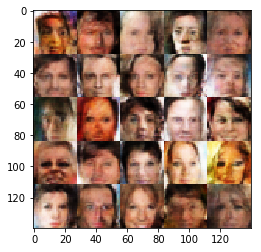

Epoch 2/5... Discriminator Loss: 0.6900... Generator Loss: 1.3713
Epoch 2/5... Discriminator Loss: 0.8303... Generator Loss: 0.8912
Epoch 2/5... Discriminator Loss: 0.4556... Generator Loss: 1.8261
Epoch 2/5... Discriminator Loss: 0.6692... Generator Loss: 1.2337
Epoch 2/5... Discriminator Loss: 0.5798... Generator Loss: 1.6617
Epoch 2/5... Discriminator Loss: 0.3550... Generator Loss: 2.4888
Epoch 2/5... Discriminator Loss: 2.3789... Generator Loss: 0.1779
Epoch 2/5... Discriminator Loss: 2.4762... Generator Loss: 0.2018
Epoch 2/5... Discriminator Loss: 1.8058... Generator Loss: 0.3961
Epoch 2/5... Discriminator Loss: 1.0558... Generator Loss: 0.7382
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


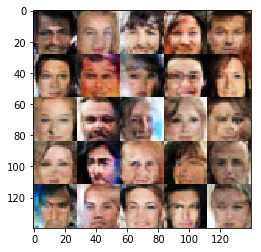

Epoch 2/5... Discriminator Loss: 0.9715... Generator Loss: 1.2254
Epoch 2/5... Discriminator Loss: 0.8402... Generator Loss: 1.1392
Epoch 2/5... Discriminator Loss: 0.8421... Generator Loss: 1.7746
Epoch 2/5... Discriminator Loss: 0.8409... Generator Loss: 1.1510
Epoch 2/5... Discriminator Loss: 0.6737... Generator Loss: 1.9137
Epoch 2/5... Discriminator Loss: 1.3169... Generator Loss: 2.0470
Epoch 2/5... Discriminator Loss: 0.5458... Generator Loss: 2.0581
Epoch 2/5... Discriminator Loss: 0.6387... Generator Loss: 1.3877
Epoch 2/5... Discriminator Loss: 0.7495... Generator Loss: 1.0945
Epoch 2/5... Discriminator Loss: 0.6546... Generator Loss: 1.7208
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


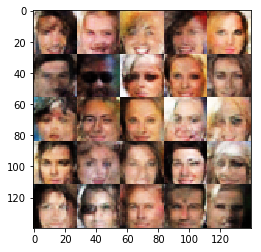

Epoch 2/5... Discriminator Loss: 1.0300... Generator Loss: 2.8965
Epoch 2/5... Discriminator Loss: 0.5646... Generator Loss: 1.5740
Epoch 2/5... Discriminator Loss: 0.3160... Generator Loss: 2.4842
Epoch 2/5... Discriminator Loss: 0.3858... Generator Loss: 1.6843
Epoch 2/5... Discriminator Loss: 0.9140... Generator Loss: 0.7182
Epoch 2/5... Discriminator Loss: 3.1328... Generator Loss: 4.4426
Epoch 2/5... Discriminator Loss: 1.4659... Generator Loss: 0.4322
Epoch 2/5... Discriminator Loss: 0.5151... Generator Loss: 1.8492
Epoch 2/5... Discriminator Loss: 0.3374... Generator Loss: 1.9988
Epoch 2/5... Discriminator Loss: 2.3084... Generator Loss: 0.4053
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


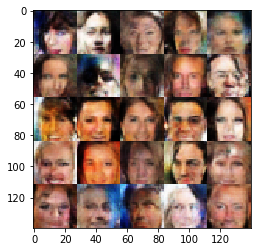

Epoch 2/5... Discriminator Loss: 0.9109... Generator Loss: 1.1186
Epoch 2/5... Discriminator Loss: 0.7498... Generator Loss: 1.2878
Epoch 2/5... Discriminator Loss: 1.4805... Generator Loss: 1.9049
Epoch 2/5... Discriminator Loss: 1.3647... Generator Loss: 0.4761
Epoch 2/5... Discriminator Loss: 1.1006... Generator Loss: 1.8784
Epoch 2/5... Discriminator Loss: 0.6862... Generator Loss: 1.5624
Epoch 2/5... Discriminator Loss: 0.6414... Generator Loss: 1.6784
Epoch 2/5... Discriminator Loss: 0.7141... Generator Loss: 2.7087
Epoch 2/5... Discriminator Loss: 1.2909... Generator Loss: 2.2650
Epoch 2/5... Discriminator Loss: 0.8854... Generator Loss: 0.8510
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


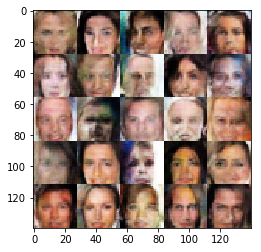

Epoch 2/5... Discriminator Loss: 0.6450... Generator Loss: 1.1289
Epoch 2/5... Discriminator Loss: 1.0724... Generator Loss: 2.1364
Epoch 2/5... Discriminator Loss: 0.6607... Generator Loss: 1.3668
Epoch 2/5... Discriminator Loss: 0.7314... Generator Loss: 2.4821
Epoch 2/5... Discriminator Loss: 1.0491... Generator Loss: 0.6352
Epoch 2/5... Discriminator Loss: 0.7381... Generator Loss: 1.1903
Epoch 2/5... Discriminator Loss: 0.5632... Generator Loss: 1.4185
Epoch 2/5... Discriminator Loss: 0.4506... Generator Loss: 3.1277
Epoch 2/5... Discriminator Loss: 1.8540... Generator Loss: 2.3268
Epoch 2/5... Discriminator Loss: 0.9666... Generator Loss: 1.3497
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


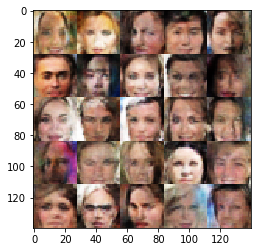

Epoch 2/5... Discriminator Loss: 0.8630... Generator Loss: 1.3385
Epoch 2/5... Discriminator Loss: 0.8772... Generator Loss: 1.0867
Epoch 2/5... Discriminator Loss: 0.8132... Generator Loss: 1.9920
Epoch 2/5... Discriminator Loss: 1.1016... Generator Loss: 0.6253
Epoch 2/5... Discriminator Loss: 0.8056... Generator Loss: 2.5514
Epoch 2/5... Discriminator Loss: 0.8499... Generator Loss: 1.2875
Epoch 2/5... Discriminator Loss: 0.6529... Generator Loss: 1.6480
Epoch 2/5... Discriminator Loss: 0.8357... Generator Loss: 1.2807
Epoch 2/5... Discriminator Loss: 1.3916... Generator Loss: 2.1217
Epoch 2/5... Discriminator Loss: 0.8319... Generator Loss: 1.0009
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


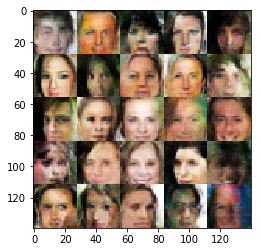

Epoch 2/5... Discriminator Loss: 0.7564... Generator Loss: 1.1682
Epoch 2/5... Discriminator Loss: 0.7843... Generator Loss: 3.5272
Epoch 2/5... Discriminator Loss: 1.0423... Generator Loss: 0.7459
Epoch 2/5... Discriminator Loss: 1.4132... Generator Loss: 0.4164
Epoch 2/5... Discriminator Loss: 0.6973... Generator Loss: 1.0988
Epoch 2/5... Discriminator Loss: 0.5094... Generator Loss: 1.8526
Epoch 2/5... Discriminator Loss: 0.8094... Generator Loss: 0.8332
Epoch 2/5... Discriminator Loss: 0.9806... Generator Loss: 0.7453
Epoch 2/5... Discriminator Loss: 1.8405... Generator Loss: 0.3625
Epoch 2/5... Discriminator Loss: 0.7078... Generator Loss: 1.4606
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


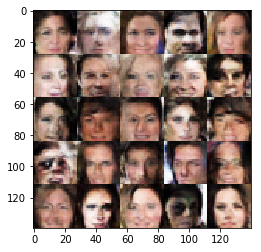

Epoch 2/5... Discriminator Loss: 1.3155... Generator Loss: 0.5273
Epoch 2/5... Discriminator Loss: 1.2640... Generator Loss: 0.4889
Epoch 2/5... Discriminator Loss: 0.7994... Generator Loss: 2.9287
Epoch 2/5... Discriminator Loss: 1.7551... Generator Loss: 0.3007
Epoch 2/5... Discriminator Loss: 0.6547... Generator Loss: 1.4080
Epoch 2/5... Discriminator Loss: 0.8015... Generator Loss: 1.0584
Epoch 2/5... Discriminator Loss: 1.4500... Generator Loss: 0.6560
Epoch 2/5... Discriminator Loss: 1.3205... Generator Loss: 0.5367
Epoch 2/5... Discriminator Loss: 0.9056... Generator Loss: 0.7458
Epoch 2/5... Discriminator Loss: 1.1205... Generator Loss: 0.5594
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


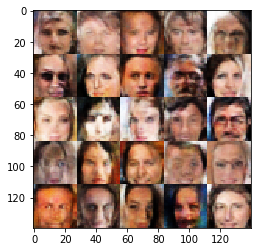

Epoch 2/5... Discriminator Loss: 0.5737... Generator Loss: 1.7160
Epoch 2/5... Discriminator Loss: 0.6939... Generator Loss: 1.3393
Epoch 2/5... Discriminator Loss: 0.5915... Generator Loss: 2.3399
Epoch 2/5... Discriminator Loss: 0.6767... Generator Loss: 1.3042
Epoch 2/5... Discriminator Loss: 1.0713... Generator Loss: 0.6662
Epoch 2/5... Discriminator Loss: 0.4557... Generator Loss: 1.9826
Epoch 2/5... Discriminator Loss: 0.6769... Generator Loss: 1.2544
Epoch 2/5... Discriminator Loss: 0.9681... Generator Loss: 0.7977
Epoch 2/5... Discriminator Loss: 0.8661... Generator Loss: 0.8366
Epoch 2/5... Discriminator Loss: 0.6764... Generator Loss: 1.1591
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


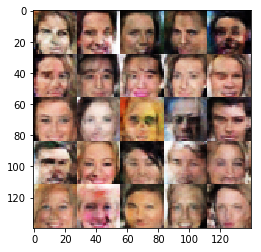

Epoch 2/5... Discriminator Loss: 1.5370... Generator Loss: 0.4246
Epoch 2/5... Discriminator Loss: 0.8058... Generator Loss: 0.9727
Epoch 2/5... Discriminator Loss: 0.8196... Generator Loss: 0.9498
Epoch 2/5... Discriminator Loss: 0.9487... Generator Loss: 0.7753
Epoch 2/5... Discriminator Loss: 0.5708... Generator Loss: 2.0945
Epoch 2/5... Discriminator Loss: 0.7477... Generator Loss: 1.7900
Epoch 2/5... Discriminator Loss: 1.4436... Generator Loss: 3.2961
Epoch 2/5... Discriminator Loss: 0.8846... Generator Loss: 1.1896
Epoch 2/5... Discriminator Loss: 0.7316... Generator Loss: 2.1114
Epoch 2/5... Discriminator Loss: 0.4939... Generator Loss: 2.6746
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


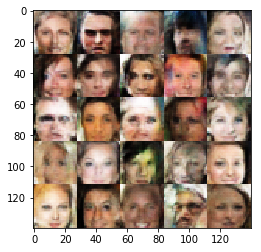

Epoch 2/5... Discriminator Loss: 0.5050... Generator Loss: 2.2144
Epoch 2/5... Discriminator Loss: 1.6719... Generator Loss: 0.3221
Epoch 2/5... Discriminator Loss: 0.4347... Generator Loss: 2.0326
Epoch 2/5... Discriminator Loss: 0.4893... Generator Loss: 1.7264
Epoch 2/5... Discriminator Loss: 0.5524... Generator Loss: 2.9739
Epoch 2/5... Discriminator Loss: 1.9737... Generator Loss: 3.3116
Epoch 2/5... Discriminator Loss: 1.2270... Generator Loss: 2.2478
Epoch 2/5... Discriminator Loss: 0.7616... Generator Loss: 1.9346
Epoch 2/5... Discriminator Loss: 1.2674... Generator Loss: 0.5557
Epoch 2/5... Discriminator Loss: 1.0315... Generator Loss: 0.7764
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


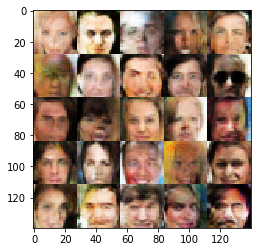

Epoch 2/5... Discriminator Loss: 1.5660... Generator Loss: 1.8057
Epoch 2/5... Discriminator Loss: 0.5432... Generator Loss: 1.9640
Epoch 2/5... Discriminator Loss: 0.6749... Generator Loss: 1.9497
Epoch 2/5... Discriminator Loss: 0.8895... Generator Loss: 1.0434
Epoch 2/5... Discriminator Loss: 2.0080... Generator Loss: 4.5786
Epoch 2/5... Discriminator Loss: 1.1648... Generator Loss: 0.6306
Epoch 2/5... Discriminator Loss: 1.2513... Generator Loss: 0.5448
Epoch 2/5... Discriminator Loss: 0.6870... Generator Loss: 1.0273
Epoch 2/5... Discriminator Loss: 1.3020... Generator Loss: 0.5608
Epoch 2/5... Discriminator Loss: 1.1475... Generator Loss: 0.6184
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


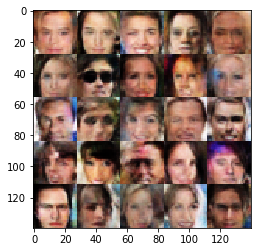

Epoch 2/5... Discriminator Loss: 0.7731... Generator Loss: 1.0866
Epoch 2/5... Discriminator Loss: 1.3344... Generator Loss: 0.4706
Epoch 2/5... Discriminator Loss: 1.0015... Generator Loss: 0.6687
Epoch 2/5... Discriminator Loss: 0.5172... Generator Loss: 1.5559
Epoch 2/5... Discriminator Loss: 0.9366... Generator Loss: 0.7714
Epoch 2/5... Discriminator Loss: 0.7340... Generator Loss: 2.6517
Epoch 2/5... Discriminator Loss: 0.8046... Generator Loss: 0.8716
Epoch 2/5... Discriminator Loss: 0.6393... Generator Loss: 1.2872
Epoch 2/5... Discriminator Loss: 0.4929... Generator Loss: 1.8216
Epoch 2/5... Discriminator Loss: 0.7828... Generator Loss: 1.1545
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


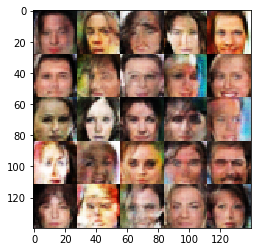

Epoch 2/5... Discriminator Loss: 0.7088... Generator Loss: 1.5322
Epoch 2/5... Discriminator Loss: 1.0594... Generator Loss: 1.1485
Epoch 2/5... Discriminator Loss: 0.9363... Generator Loss: 0.8739
Epoch 2/5... Discriminator Loss: 0.6010... Generator Loss: 1.3525
Epoch 2/5... Discriminator Loss: 0.7609... Generator Loss: 1.5576
Epoch 2/5... Discriminator Loss: 1.3645... Generator Loss: 0.4335
Epoch 2/5... Discriminator Loss: 1.3537... Generator Loss: 0.4524
Epoch 2/5... Discriminator Loss: 0.5819... Generator Loss: 1.3138
Epoch 2/5... Discriminator Loss: 1.1466... Generator Loss: 0.6692
Epoch 2/5... Discriminator Loss: 0.6288... Generator Loss: 1.4053
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


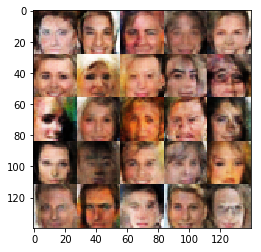

Epoch 2/5... Discriminator Loss: 0.9113... Generator Loss: 1.1064
Epoch 2/5... Discriminator Loss: 0.6867... Generator Loss: 1.4287
Epoch 2/5... Discriminator Loss: 1.7315... Generator Loss: 0.2822
Epoch 2/5... Discriminator Loss: 1.0260... Generator Loss: 0.8864
Epoch 2/5... Discriminator Loss: 0.7212... Generator Loss: 1.0995
Epoch 2/5... Discriminator Loss: 1.4118... Generator Loss: 0.4390
Epoch 2/5... Discriminator Loss: 1.2863... Generator Loss: 0.5187
Epoch 2/5... Discriminator Loss: 0.5209... Generator Loss: 1.6591
Epoch 2/5... Discriminator Loss: 1.0155... Generator Loss: 0.6592
Epoch 2/5... Discriminator Loss: 1.0666... Generator Loss: 0.6118
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


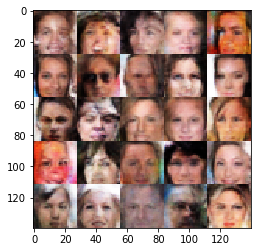

Epoch 2/5... Discriminator Loss: 0.8198... Generator Loss: 0.8734
Epoch 2/5... Discriminator Loss: 0.9885... Generator Loss: 0.8851
Epoch 2/5... Discriminator Loss: 0.9555... Generator Loss: 0.7450
Epoch 2/5... Discriminator Loss: 0.5573... Generator Loss: 1.9602
Epoch 2/5... Discriminator Loss: 0.9504... Generator Loss: 2.4086
Epoch 2/5... Discriminator Loss: 2.4784... Generator Loss: 0.1390
Epoch 2/5... Discriminator Loss: 0.6553... Generator Loss: 1.4620
Epoch 2/5... Discriminator Loss: 0.8179... Generator Loss: 2.9896
Epoch 2/5... Discriminator Loss: 0.6941... Generator Loss: 1.7213
Epoch 2/5... Discriminator Loss: 0.7186... Generator Loss: 2.9026
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


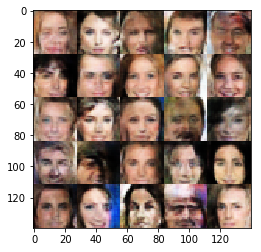

Epoch 2/5... Discriminator Loss: 1.1247... Generator Loss: 0.5869
Epoch 2/5... Discriminator Loss: 0.9784... Generator Loss: 0.7940
Epoch 2/5... Discriminator Loss: 0.9942... Generator Loss: 0.7614
Epoch 2/5... Discriminator Loss: 0.8511... Generator Loss: 0.9321
Epoch 2/5... Discriminator Loss: 0.4916... Generator Loss: 2.0393
Epoch 2/5... Discriminator Loss: 0.4436... Generator Loss: 2.1368
Epoch 2/5... Discriminator Loss: 1.4228... Generator Loss: 0.4381
Epoch 2/5... Discriminator Loss: 0.9095... Generator Loss: 2.9372
Epoch 2/5... Discriminator Loss: 0.6646... Generator Loss: 1.5428
Epoch 2/5... Discriminator Loss: 0.8369... Generator Loss: 1.2068
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


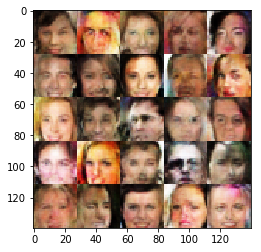

Epoch 2/5... Discriminator Loss: 0.5682... Generator Loss: 1.2892
Epoch 2/5... Discriminator Loss: 0.5573... Generator Loss: 1.4939
Epoch 2/5... Discriminator Loss: 1.1611... Generator Loss: 1.8553
Epoch 2/5... Discriminator Loss: 0.4659... Generator Loss: 3.1269
Epoch 2/5... Discriminator Loss: 0.8027... Generator Loss: 1.9920
Epoch 2/5... Discriminator Loss: 0.9983... Generator Loss: 0.7544
Epoch 2/5... Discriminator Loss: 0.5788... Generator Loss: 1.7003
Epoch 2/5... Discriminator Loss: 2.0617... Generator Loss: 0.2178
Epoch 2/5... Discriminator Loss: 3.8855... Generator Loss: 1.1841
Epoch 2/5... Discriminator Loss: 1.2130... Generator Loss: 0.5534
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


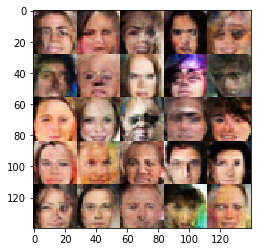

Epoch 2/5... Discriminator Loss: 0.7459... Generator Loss: 1.7733
Epoch 2/5... Discriminator Loss: 1.4565... Generator Loss: 0.4572
Epoch 2/5... Discriminator Loss: 1.5451... Generator Loss: 0.4196
Epoch 3/5... Discriminator Loss: 0.6986... Generator Loss: 1.2720
Epoch 3/5... Discriminator Loss: 0.4901... Generator Loss: 2.1598
Epoch 3/5... Discriminator Loss: 1.0099... Generator Loss: 1.4411
Epoch 3/5... Discriminator Loss: 0.8960... Generator Loss: 0.8588
Epoch 3/5... Discriminator Loss: 0.4913... Generator Loss: 2.0586
Epoch 3/5... Discriminator Loss: 0.9869... Generator Loss: 2.5272
Epoch 3/5... Discriminator Loss: 2.3345... Generator Loss: 0.1855
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


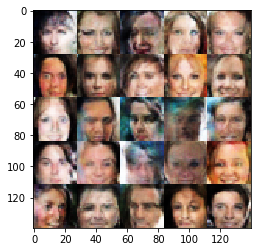

Epoch 3/5... Discriminator Loss: 0.9685... Generator Loss: 0.7978
Epoch 3/5... Discriminator Loss: 1.4283... Generator Loss: 0.4281
Epoch 3/5... Discriminator Loss: 1.2507... Generator Loss: 0.5960
Epoch 3/5... Discriminator Loss: 1.0884... Generator Loss: 0.6158
Epoch 3/5... Discriminator Loss: 0.7788... Generator Loss: 1.7485
Epoch 3/5... Discriminator Loss: 0.6265... Generator Loss: 1.6592
Epoch 3/5... Discriminator Loss: 0.6155... Generator Loss: 1.4405
Epoch 3/5... Discriminator Loss: 1.7837... Generator Loss: 0.3171
Epoch 3/5... Discriminator Loss: 1.0347... Generator Loss: 0.7544
Epoch 3/5... Discriminator Loss: 0.5176... Generator Loss: 1.5659
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


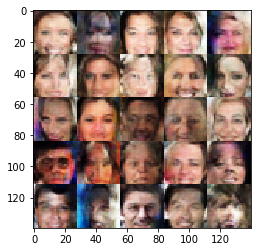

Epoch 3/5... Discriminator Loss: 1.0762... Generator Loss: 0.6909
Epoch 3/5... Discriminator Loss: 1.3081... Generator Loss: 2.5338
Epoch 3/5... Discriminator Loss: 0.6588... Generator Loss: 1.3150
Epoch 3/5... Discriminator Loss: 0.8892... Generator Loss: 2.1237
Epoch 3/5... Discriminator Loss: 0.6240... Generator Loss: 1.6660
Epoch 3/5... Discriminator Loss: 0.7024... Generator Loss: 1.2310
Epoch 3/5... Discriminator Loss: 2.0824... Generator Loss: 3.2782
Epoch 3/5... Discriminator Loss: 0.8977... Generator Loss: 1.6167
Epoch 3/5... Discriminator Loss: 1.5787... Generator Loss: 0.4258
Epoch 3/5... Discriminator Loss: 0.8162... Generator Loss: 1.1036
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


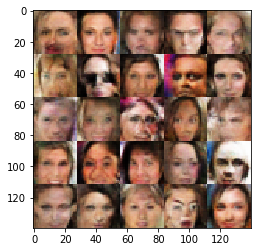

Epoch 3/5... Discriminator Loss: 1.0034... Generator Loss: 0.7184
Epoch 3/5... Discriminator Loss: 1.3686... Generator Loss: 0.4503
Epoch 3/5... Discriminator Loss: 1.0278... Generator Loss: 0.6822
Epoch 3/5... Discriminator Loss: 1.0702... Generator Loss: 0.7077
Epoch 3/5... Discriminator Loss: 1.1365... Generator Loss: 0.6429
Epoch 3/5... Discriminator Loss: 1.1432... Generator Loss: 0.6038
Epoch 3/5... Discriminator Loss: 1.1497... Generator Loss: 0.5859
Epoch 3/5... Discriminator Loss: 0.6519... Generator Loss: 1.2708
Epoch 3/5... Discriminator Loss: 0.8947... Generator Loss: 0.8649
Epoch 3/5... Discriminator Loss: 1.4951... Generator Loss: 0.5154
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


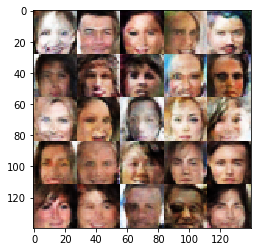

Epoch 3/5... Discriminator Loss: 0.9480... Generator Loss: 1.5997
Epoch 3/5... Discriminator Loss: 0.7683... Generator Loss: 1.8536
Epoch 3/5... Discriminator Loss: 0.8251... Generator Loss: 0.9995
Epoch 3/5... Discriminator Loss: 0.6362... Generator Loss: 2.8391
Epoch 3/5... Discriminator Loss: 1.4438... Generator Loss: 2.1570
Epoch 3/5... Discriminator Loss: 1.0073... Generator Loss: 0.6575
Epoch 3/5... Discriminator Loss: 0.8821... Generator Loss: 1.7483
Epoch 3/5... Discriminator Loss: 0.7853... Generator Loss: 0.9895
Epoch 3/5... Discriminator Loss: 0.6412... Generator Loss: 1.2177
Epoch 3/5... Discriminator Loss: 0.8396... Generator Loss: 1.0202
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


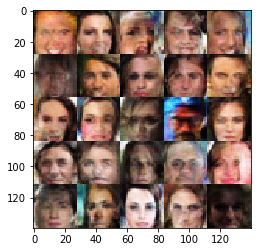

Epoch 3/5... Discriminator Loss: 0.7125... Generator Loss: 1.2351
Epoch 3/5... Discriminator Loss: 0.9967... Generator Loss: 0.8068
Epoch 3/5... Discriminator Loss: 0.7847... Generator Loss: 0.9897
Epoch 3/5... Discriminator Loss: 0.7308... Generator Loss: 1.4225
Epoch 3/5... Discriminator Loss: 1.8699... Generator Loss: 0.2803
Epoch 3/5... Discriminator Loss: 1.1614... Generator Loss: 0.5469
Epoch 3/5... Discriminator Loss: 1.0645... Generator Loss: 0.6062
Epoch 3/5... Discriminator Loss: 0.9279... Generator Loss: 0.9664
Epoch 3/5... Discriminator Loss: 1.8152... Generator Loss: 0.3584
Epoch 3/5... Discriminator Loss: 1.0227... Generator Loss: 1.1702
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


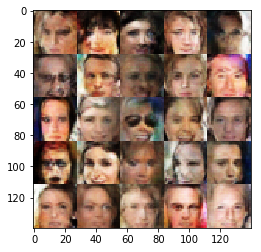

Epoch 3/5... Discriminator Loss: 1.0337... Generator Loss: 1.8658
Epoch 3/5... Discriminator Loss: 0.5876... Generator Loss: 2.1607
Epoch 3/5... Discriminator Loss: 0.6784... Generator Loss: 2.0548
Epoch 3/5... Discriminator Loss: 0.6886... Generator Loss: 1.8913
Epoch 3/5... Discriminator Loss: 0.8373... Generator Loss: 1.2327
Epoch 3/5... Discriminator Loss: 0.8283... Generator Loss: 1.0281
Epoch 3/5... Discriminator Loss: 1.5088... Generator Loss: 0.3830
Epoch 3/5... Discriminator Loss: 0.6569... Generator Loss: 1.9422
Epoch 3/5... Discriminator Loss: 0.8346... Generator Loss: 0.8584
Epoch 3/5... Discriminator Loss: 1.6513... Generator Loss: 0.3217
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


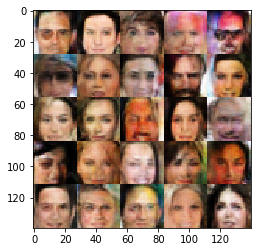

Epoch 3/5... Discriminator Loss: 2.0328... Generator Loss: 0.3446
Epoch 3/5... Discriminator Loss: 1.4840... Generator Loss: 0.3975
Epoch 3/5... Discriminator Loss: 0.7917... Generator Loss: 1.2123
Epoch 3/5... Discriminator Loss: 0.8316... Generator Loss: 2.2121
Epoch 3/5... Discriminator Loss: 2.0050... Generator Loss: 0.2736
Epoch 3/5... Discriminator Loss: 1.6503... Generator Loss: 0.3461
Epoch 3/5... Discriminator Loss: 0.6663... Generator Loss: 1.2270
Epoch 3/5... Discriminator Loss: 0.7358... Generator Loss: 1.3269
Epoch 3/5... Discriminator Loss: 0.8176... Generator Loss: 0.8564
Epoch 3/5... Discriminator Loss: 1.0487... Generator Loss: 0.6678
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


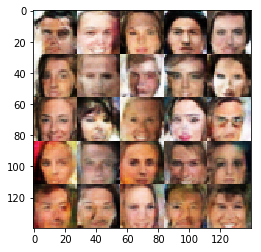

Epoch 3/5... Discriminator Loss: 0.8414... Generator Loss: 0.9972
Epoch 3/5... Discriminator Loss: 0.8845... Generator Loss: 2.1068
Epoch 3/5... Discriminator Loss: 0.7142... Generator Loss: 1.4112
Epoch 3/5... Discriminator Loss: 0.6695... Generator Loss: 1.4980
Epoch 3/5... Discriminator Loss: 1.0661... Generator Loss: 1.6065
Epoch 3/5... Discriminator Loss: 1.1617... Generator Loss: 0.6344
Epoch 3/5... Discriminator Loss: 0.9428... Generator Loss: 1.4281
Epoch 3/5... Discriminator Loss: 0.7406... Generator Loss: 1.0397
Epoch 3/5... Discriminator Loss: 2.9160... Generator Loss: 0.1317
Epoch 3/5... Discriminator Loss: 1.4139... Generator Loss: 2.6880
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


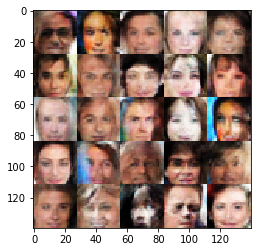

Epoch 3/5... Discriminator Loss: 1.2705... Generator Loss: 2.1101
Epoch 3/5... Discriminator Loss: 0.7536... Generator Loss: 1.1154
Epoch 3/5... Discriminator Loss: 0.7687... Generator Loss: 1.9958
Epoch 3/5... Discriminator Loss: 0.8388... Generator Loss: 2.1840
Epoch 3/5... Discriminator Loss: 0.8021... Generator Loss: 0.8956
Epoch 3/5... Discriminator Loss: 0.8357... Generator Loss: 0.9362
Epoch 3/5... Discriminator Loss: 0.8709... Generator Loss: 0.9378
Epoch 3/5... Discriminator Loss: 1.2504... Generator Loss: 0.5286
Epoch 3/5... Discriminator Loss: 1.0298... Generator Loss: 1.4619
Epoch 3/5... Discriminator Loss: 0.4509... Generator Loss: 1.9956
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


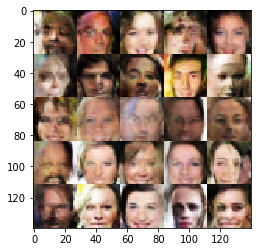

Epoch 3/5... Discriminator Loss: 0.9155... Generator Loss: 0.8817
Epoch 3/5... Discriminator Loss: 0.7799... Generator Loss: 0.9683
Epoch 3/5... Discriminator Loss: 0.4441... Generator Loss: 2.1618
Epoch 3/5... Discriminator Loss: 1.2498... Generator Loss: 0.4803
Epoch 3/5... Discriminator Loss: 0.9141... Generator Loss: 0.8047
Epoch 3/5... Discriminator Loss: 1.8328... Generator Loss: 0.2889
Epoch 3/5... Discriminator Loss: 1.2265... Generator Loss: 0.5664
Epoch 3/5... Discriminator Loss: 1.3541... Generator Loss: 2.2408
Epoch 3/5... Discriminator Loss: 0.8571... Generator Loss: 2.0046
Epoch 3/5... Discriminator Loss: 0.8730... Generator Loss: 2.2186
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


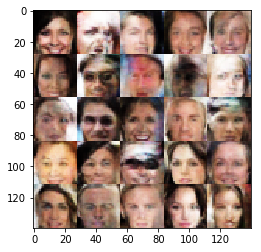

Epoch 3/5... Discriminator Loss: 0.9144... Generator Loss: 0.7764
Epoch 3/5... Discriminator Loss: 0.6662... Generator Loss: 1.1546
Epoch 3/5... Discriminator Loss: 1.2522... Generator Loss: 1.2198
Epoch 3/5... Discriminator Loss: 1.6321... Generator Loss: 0.4121
Epoch 3/5... Discriminator Loss: 0.9325... Generator Loss: 1.2264
Epoch 3/5... Discriminator Loss: 0.9157... Generator Loss: 0.9744
Epoch 3/5... Discriminator Loss: 0.7846... Generator Loss: 2.6696
Epoch 3/5... Discriminator Loss: 0.6422... Generator Loss: 1.3888
Epoch 3/5... Discriminator Loss: 0.7964... Generator Loss: 1.0442
Epoch 3/5... Discriminator Loss: 0.8948... Generator Loss: 0.8065
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


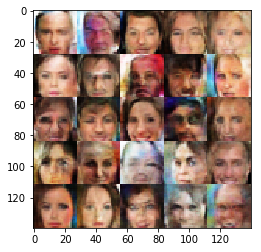

Epoch 3/5... Discriminator Loss: 0.9046... Generator Loss: 1.8869
Epoch 3/5... Discriminator Loss: 2.0448... Generator Loss: 2.6482
Epoch 3/5... Discriminator Loss: 0.9844... Generator Loss: 0.7006
Epoch 3/5... Discriminator Loss: 0.7565... Generator Loss: 1.1876
Epoch 3/5... Discriminator Loss: 0.9260... Generator Loss: 0.8910
Epoch 3/5... Discriminator Loss: 1.2821... Generator Loss: 0.5126
Epoch 3/5... Discriminator Loss: 0.4168... Generator Loss: 1.7003
Epoch 3/5... Discriminator Loss: 0.9134... Generator Loss: 0.8199
Epoch 3/5... Discriminator Loss: 1.8471... Generator Loss: 0.2796
Epoch 3/5... Discriminator Loss: 1.1792... Generator Loss: 2.5000
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


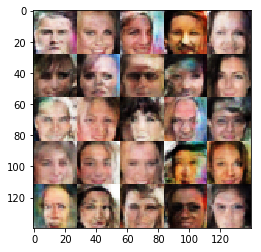

Epoch 3/5... Discriminator Loss: 1.2153... Generator Loss: 0.6733
Epoch 3/5... Discriminator Loss: 0.7510... Generator Loss: 1.1940
Epoch 3/5... Discriminator Loss: 0.7689... Generator Loss: 1.5239
Epoch 3/5... Discriminator Loss: 1.5430... Generator Loss: 0.3768
Epoch 3/5... Discriminator Loss: 0.9417... Generator Loss: 0.9225
Epoch 3/5... Discriminator Loss: 1.5243... Generator Loss: 0.4545
Epoch 3/5... Discriminator Loss: 1.5110... Generator Loss: 0.3824
Epoch 3/5... Discriminator Loss: 0.7955... Generator Loss: 1.7671
Epoch 3/5... Discriminator Loss: 0.7128... Generator Loss: 1.1641
Epoch 3/5... Discriminator Loss: 0.7894... Generator Loss: 1.6341
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


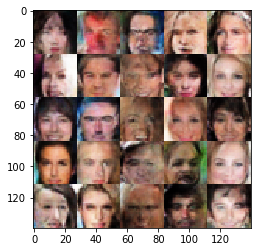

Epoch 3/5... Discriminator Loss: 1.4938... Generator Loss: 0.4342
Epoch 3/5... Discriminator Loss: 1.0262... Generator Loss: 0.6522
Epoch 3/5... Discriminator Loss: 1.2292... Generator Loss: 0.5961
Epoch 3/5... Discriminator Loss: 0.9051... Generator Loss: 0.9134
Epoch 3/5... Discriminator Loss: 0.7592... Generator Loss: 1.7865
Epoch 3/5... Discriminator Loss: 1.3275... Generator Loss: 0.5668
Epoch 3/5... Discriminator Loss: 0.6839... Generator Loss: 2.1869
Epoch 3/5... Discriminator Loss: 0.8719... Generator Loss: 1.0119
Epoch 3/5... Discriminator Loss: 0.8155... Generator Loss: 0.9712
Epoch 3/5... Discriminator Loss: 0.5471... Generator Loss: 1.2642
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


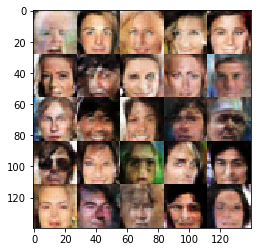

Epoch 3/5... Discriminator Loss: 0.5688... Generator Loss: 1.8136
Epoch 3/5... Discriminator Loss: 0.4964... Generator Loss: 1.6709
Epoch 3/5... Discriminator Loss: 0.4657... Generator Loss: 1.5973
Epoch 3/5... Discriminator Loss: 1.1905... Generator Loss: 2.9959
Epoch 3/5... Discriminator Loss: 0.9509... Generator Loss: 1.2169
Epoch 3/5... Discriminator Loss: 0.6492... Generator Loss: 1.7034
Epoch 3/5... Discriminator Loss: 0.8192... Generator Loss: 1.2318
Epoch 3/5... Discriminator Loss: 0.5678... Generator Loss: 1.8700
Epoch 3/5... Discriminator Loss: 0.5171... Generator Loss: 1.7377
Epoch 3/5... Discriminator Loss: 1.2188... Generator Loss: 0.5500
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


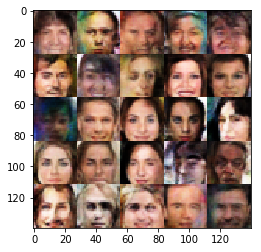

Epoch 3/5... Discriminator Loss: 0.6507... Generator Loss: 2.7651
Epoch 3/5... Discriminator Loss: 0.9051... Generator Loss: 0.7481
Epoch 3/5... Discriminator Loss: 0.6814... Generator Loss: 1.6400
Epoch 3/5... Discriminator Loss: 1.1330... Generator Loss: 0.7874
Epoch 3/5... Discriminator Loss: 1.0268... Generator Loss: 0.7273
Epoch 3/5... Discriminator Loss: 1.2256... Generator Loss: 0.5921
Epoch 3/5... Discriminator Loss: 1.7572... Generator Loss: 0.3327
Epoch 3/5... Discriminator Loss: 2.2459... Generator Loss: 0.2414
Epoch 3/5... Discriminator Loss: 1.5288... Generator Loss: 2.3527
Epoch 3/5... Discriminator Loss: 1.2306... Generator Loss: 0.5853
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


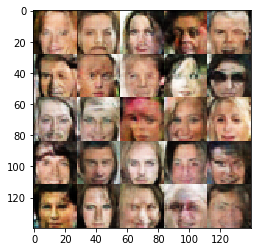

Epoch 3/5... Discriminator Loss: 1.0317... Generator Loss: 1.1561
Epoch 3/5... Discriminator Loss: 0.7421... Generator Loss: 1.2933
Epoch 3/5... Discriminator Loss: 0.9106... Generator Loss: 0.8996
Epoch 3/5... Discriminator Loss: 0.7229... Generator Loss: 2.0095
Epoch 3/5... Discriminator Loss: 0.8484... Generator Loss: 0.9354
Epoch 3/5... Discriminator Loss: 0.8200... Generator Loss: 1.7370
Epoch 3/5... Discriminator Loss: 1.1153... Generator Loss: 0.6343
Epoch 3/5... Discriminator Loss: 1.3732... Generator Loss: 0.4360
Epoch 3/5... Discriminator Loss: 0.8588... Generator Loss: 1.2905
Epoch 3/5... Discriminator Loss: 1.3464... Generator Loss: 0.4522
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


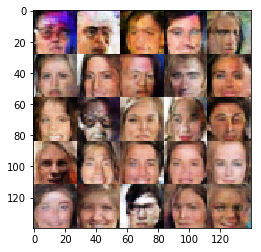

Epoch 3/5... Discriminator Loss: 1.3783... Generator Loss: 0.5314
Epoch 3/5... Discriminator Loss: 0.9518... Generator Loss: 0.8824
Epoch 3/5... Discriminator Loss: 1.4757... Generator Loss: 0.4294
Epoch 3/5... Discriminator Loss: 0.7598... Generator Loss: 1.0979
Epoch 3/5... Discriminator Loss: 1.0854... Generator Loss: 0.7029
Epoch 3/5... Discriminator Loss: 1.0470... Generator Loss: 0.7232
Epoch 3/5... Discriminator Loss: 1.2789... Generator Loss: 0.4647
Epoch 3/5... Discriminator Loss: 0.8709... Generator Loss: 0.8978
Epoch 3/5... Discriminator Loss: 1.1366... Generator Loss: 0.6927
Epoch 3/5... Discriminator Loss: 0.7040... Generator Loss: 1.5782
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


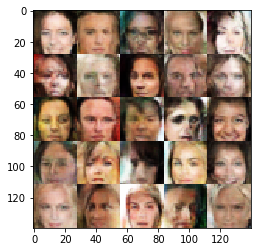

Epoch 3/5... Discriminator Loss: 0.5839... Generator Loss: 1.3959
Epoch 3/5... Discriminator Loss: 0.9688... Generator Loss: 2.5439
Epoch 3/5... Discriminator Loss: 1.1325... Generator Loss: 0.6448
Epoch 3/5... Discriminator Loss: 0.7149... Generator Loss: 1.3646
Epoch 3/5... Discriminator Loss: 0.7634... Generator Loss: 2.3990
Epoch 3/5... Discriminator Loss: 0.9545... Generator Loss: 0.8056
Epoch 3/5... Discriminator Loss: 0.7103... Generator Loss: 1.0803
Epoch 3/5... Discriminator Loss: 0.6145... Generator Loss: 1.7856
Epoch 3/5... Discriminator Loss: 1.2538... Generator Loss: 2.4707
Epoch 3/5... Discriminator Loss: 1.1040... Generator Loss: 0.7145
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


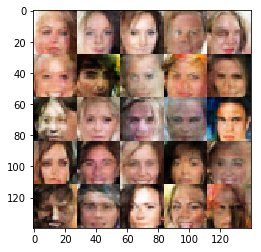

Epoch 3/5... Discriminator Loss: 0.7795... Generator Loss: 1.4777
Epoch 3/5... Discriminator Loss: 0.8659... Generator Loss: 0.9403
Epoch 3/5... Discriminator Loss: 0.7107... Generator Loss: 1.5456
Epoch 3/5... Discriminator Loss: 1.0844... Generator Loss: 3.3533
Epoch 3/5... Discriminator Loss: 1.1229... Generator Loss: 2.0318
Epoch 3/5... Discriminator Loss: 0.8373... Generator Loss: 0.9567
Epoch 3/5... Discriminator Loss: 1.6166... Generator Loss: 2.6619
Epoch 3/5... Discriminator Loss: 0.9544... Generator Loss: 0.8704
Epoch 3/5... Discriminator Loss: 0.4058... Generator Loss: 1.9253
Epoch 3/5... Discriminator Loss: 0.5860... Generator Loss: 1.8771
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


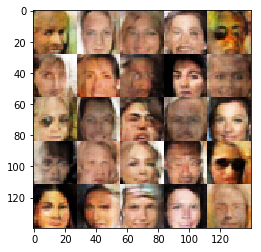

Epoch 3/5... Discriminator Loss: 0.7813... Generator Loss: 1.1014
Epoch 3/5... Discriminator Loss: 0.8333... Generator Loss: 0.9615
Epoch 3/5... Discriminator Loss: 0.7651... Generator Loss: 0.9415
Epoch 3/5... Discriminator Loss: 0.8295... Generator Loss: 1.2914
Epoch 3/5... Discriminator Loss: 1.3052... Generator Loss: 0.5616
Epoch 3/5... Discriminator Loss: 0.6872... Generator Loss: 1.4933
Epoch 3/5... Discriminator Loss: 0.8015... Generator Loss: 1.1125
Epoch 3/5... Discriminator Loss: 1.6627... Generator Loss: 0.3284
Epoch 3/5... Discriminator Loss: 1.2717... Generator Loss: 0.5253
Epoch 3/5... Discriminator Loss: 0.9117... Generator Loss: 0.8954
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


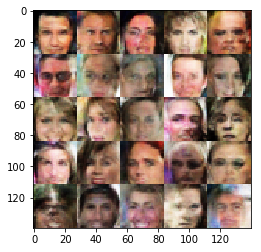

Epoch 3/5... Discriminator Loss: 1.2437... Generator Loss: 0.5328
Epoch 3/5... Discriminator Loss: 1.0027... Generator Loss: 0.9113
Epoch 3/5... Discriminator Loss: 0.9063... Generator Loss: 1.0280
Epoch 3/5... Discriminator Loss: 1.1044... Generator Loss: 0.6376
Epoch 3/5... Discriminator Loss: 0.5147... Generator Loss: 2.3569
Epoch 3/5... Discriminator Loss: 0.9827... Generator Loss: 2.5003
Epoch 3/5... Discriminator Loss: 2.1755... Generator Loss: 0.1980
Epoch 3/5... Discriminator Loss: 0.7826... Generator Loss: 1.6340
Epoch 3/5... Discriminator Loss: 0.8461... Generator Loss: 1.4332
Epoch 3/5... Discriminator Loss: 0.8386... Generator Loss: 1.0504
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


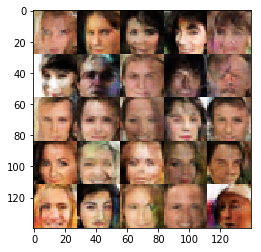

Epoch 3/5... Discriminator Loss: 1.3298... Generator Loss: 0.5108
Epoch 3/5... Discriminator Loss: 1.4166... Generator Loss: 0.4162
Epoch 3/5... Discriminator Loss: 0.5799... Generator Loss: 1.7753
Epoch 3/5... Discriminator Loss: 0.6338... Generator Loss: 1.3260
Epoch 3/5... Discriminator Loss: 0.4688... Generator Loss: 1.5580
Epoch 3/5... Discriminator Loss: 0.6980... Generator Loss: 1.0598
Epoch 3/5... Discriminator Loss: 1.3748... Generator Loss: 0.5816
Epoch 3/5... Discriminator Loss: 0.7830... Generator Loss: 1.5499
Epoch 3/5... Discriminator Loss: 2.0798... Generator Loss: 3.6492
Epoch 3/5... Discriminator Loss: 1.8824... Generator Loss: 1.6814
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


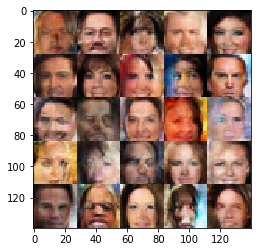

Epoch 3/5... Discriminator Loss: 1.2721... Generator Loss: 0.5354
Epoch 3/5... Discriminator Loss: 1.1517... Generator Loss: 1.9906
Epoch 3/5... Discriminator Loss: 1.7174... Generator Loss: 0.4535
Epoch 3/5... Discriminator Loss: 0.7624... Generator Loss: 1.2820
Epoch 3/5... Discriminator Loss: 0.7641... Generator Loss: 1.5267
Epoch 3/5... Discriminator Loss: 1.2555... Generator Loss: 0.5067
Epoch 3/5... Discriminator Loss: 1.0961... Generator Loss: 0.6760
Epoch 3/5... Discriminator Loss: 0.7092... Generator Loss: 1.5275
Epoch 3/5... Discriminator Loss: 0.6752... Generator Loss: 1.3427
Epoch 3/5... Discriminator Loss: 1.0430... Generator Loss: 0.6629
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


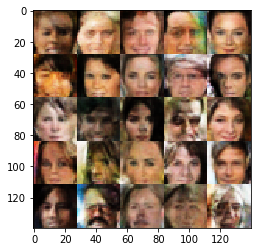

Epoch 3/5... Discriminator Loss: 0.8373... Generator Loss: 1.8175
Epoch 3/5... Discriminator Loss: 0.9195... Generator Loss: 0.8432
Epoch 3/5... Discriminator Loss: 1.8190... Generator Loss: 0.2818
Epoch 3/5... Discriminator Loss: 1.1174... Generator Loss: 0.6070
Epoch 3/5... Discriminator Loss: 0.9974... Generator Loss: 0.8844
Epoch 3/5... Discriminator Loss: 1.6544... Generator Loss: 0.4076
Epoch 3/5... Discriminator Loss: 0.9404... Generator Loss: 0.7601
Epoch 3/5... Discriminator Loss: 0.9142... Generator Loss: 1.0189
Epoch 3/5... Discriminator Loss: 1.1035... Generator Loss: 0.7529
Epoch 3/5... Discriminator Loss: 1.5850... Generator Loss: 0.3928
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


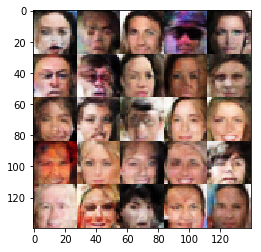

Epoch 3/5... Discriminator Loss: 0.8994... Generator Loss: 1.2729
Epoch 3/5... Discriminator Loss: 2.2409... Generator Loss: 0.2240
Epoch 3/5... Discriminator Loss: 0.5816... Generator Loss: 1.5964
Epoch 3/5... Discriminator Loss: 0.9667... Generator Loss: 0.8474
Epoch 3/5... Discriminator Loss: 1.1621... Generator Loss: 2.2454
Epoch 3/5... Discriminator Loss: 0.7144... Generator Loss: 1.4581
Epoch 3/5... Discriminator Loss: 0.7805... Generator Loss: 1.0767
Epoch 3/5... Discriminator Loss: 1.8619... Generator Loss: 0.3051
Epoch 3/5... Discriminator Loss: 1.0263... Generator Loss: 0.7089
Epoch 3/5... Discriminator Loss: 0.9884... Generator Loss: 1.9646
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


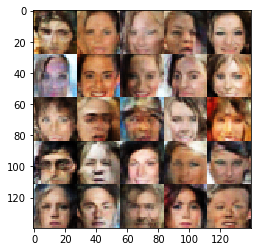

Epoch 3/5... Discriminator Loss: 1.0370... Generator Loss: 0.7076
Epoch 3/5... Discriminator Loss: 0.7852... Generator Loss: 0.9680
Epoch 3/5... Discriminator Loss: 0.8101... Generator Loss: 1.1014
Epoch 3/5... Discriminator Loss: 0.6282... Generator Loss: 1.7451
Epoch 3/5... Discriminator Loss: 0.5728... Generator Loss: 1.5799
Epoch 3/5... Discriminator Loss: 0.6825... Generator Loss: 1.9201
Epoch 3/5... Discriminator Loss: 1.5950... Generator Loss: 2.1960
Epoch 3/5... Discriminator Loss: 0.8180... Generator Loss: 1.6551
Epoch 3/5... Discriminator Loss: 0.9958... Generator Loss: 0.8463
Epoch 3/5... Discriminator Loss: 0.6926... Generator Loss: 2.0032
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


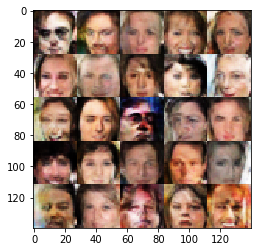

Epoch 3/5... Discriminator Loss: 0.7674... Generator Loss: 2.0624
Epoch 3/5... Discriminator Loss: 1.4440... Generator Loss: 0.4910
Epoch 3/5... Discriminator Loss: 1.8867... Generator Loss: 0.3299
Epoch 3/5... Discriminator Loss: 1.5410... Generator Loss: 0.4573
Epoch 3/5... Discriminator Loss: 1.2077... Generator Loss: 1.3147
Epoch 3/5... Discriminator Loss: 0.5909... Generator Loss: 2.7531
Epoch 3/5... Discriminator Loss: 1.3698... Generator Loss: 0.4888
Epoch 3/5... Discriminator Loss: 0.7683... Generator Loss: 2.5287
Epoch 3/5... Discriminator Loss: 0.8998... Generator Loss: 1.8570
Epoch 3/5... Discriminator Loss: 0.7560... Generator Loss: 1.5745
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


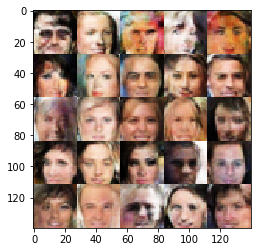

Epoch 3/5... Discriminator Loss: 0.5599... Generator Loss: 1.7002
Epoch 3/5... Discriminator Loss: 0.5860... Generator Loss: 1.4299
Epoch 3/5... Discriminator Loss: 0.6614... Generator Loss: 1.8020
Epoch 3/5... Discriminator Loss: 1.5800... Generator Loss: 0.3581
Epoch 3/5... Discriminator Loss: 0.8879... Generator Loss: 1.3879
Epoch 3/5... Discriminator Loss: 1.0559... Generator Loss: 0.7473
Epoch 3/5... Discriminator Loss: 1.2040... Generator Loss: 0.5631
Epoch 3/5... Discriminator Loss: 0.7034... Generator Loss: 1.1286
Epoch 3/5... Discriminator Loss: 1.6552... Generator Loss: 2.7831
Epoch 3/5... Discriminator Loss: 0.7490... Generator Loss: 1.7216
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


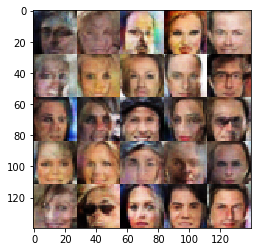

Epoch 3/5... Discriminator Loss: 1.2827... Generator Loss: 0.4841
Epoch 3/5... Discriminator Loss: 1.3200... Generator Loss: 1.3044
Epoch 3/5... Discriminator Loss: 1.7292... Generator Loss: 0.2982
Epoch 3/5... Discriminator Loss: 1.2486... Generator Loss: 0.5955
Epoch 3/5... Discriminator Loss: 0.7313... Generator Loss: 1.9672
Epoch 3/5... Discriminator Loss: 1.5166... Generator Loss: 0.3727
Epoch 3/5... Discriminator Loss: 2.2337... Generator Loss: 0.2926
Epoch 3/5... Discriminator Loss: 1.0203... Generator Loss: 1.7527
Epoch 3/5... Discriminator Loss: 1.1930... Generator Loss: 0.6069
Epoch 3/5... Discriminator Loss: 0.8163... Generator Loss: 1.0911
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


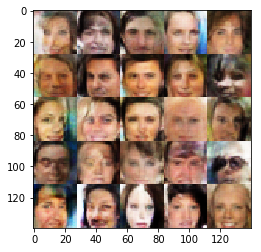

Epoch 3/5... Discriminator Loss: 0.6855... Generator Loss: 1.3621
Epoch 3/5... Discriminator Loss: 1.5776... Generator Loss: 0.4301
Epoch 3/5... Discriminator Loss: 0.6502... Generator Loss: 1.8145
Epoch 3/5... Discriminator Loss: 0.7379... Generator Loss: 2.0969
Epoch 3/5... Discriminator Loss: 1.2505... Generator Loss: 1.8519
Epoch 3/5... Discriminator Loss: 0.9815... Generator Loss: 0.8923
Epoch 3/5... Discriminator Loss: 1.1426... Generator Loss: 0.5843
Epoch 3/5... Discriminator Loss: 0.8882... Generator Loss: 1.5803
Epoch 3/5... Discriminator Loss: 1.0512... Generator Loss: 0.7282
Epoch 4/5... Discriminator Loss: 2.0186... Generator Loss: 2.4251
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


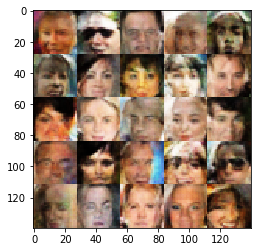

Epoch 4/5... Discriminator Loss: 0.6827... Generator Loss: 2.0323
Epoch 4/5... Discriminator Loss: 1.0799... Generator Loss: 1.0194
Epoch 4/5... Discriminator Loss: 1.2491... Generator Loss: 0.5952
Epoch 4/5... Discriminator Loss: 0.8489... Generator Loss: 0.9343
Epoch 4/5... Discriminator Loss: 0.9383... Generator Loss: 0.8237
Epoch 4/5... Discriminator Loss: 0.8145... Generator Loss: 1.0656
Epoch 4/5... Discriminator Loss: 1.4521... Generator Loss: 0.4918
Epoch 4/5... Discriminator Loss: 1.2541... Generator Loss: 0.4941
Epoch 4/5... Discriminator Loss: 1.5832... Generator Loss: 0.3492
Epoch 4/5... Discriminator Loss: 1.2413... Generator Loss: 0.6593
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


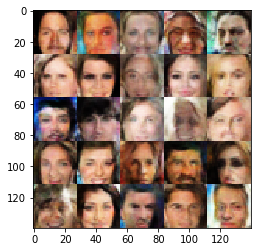

Epoch 4/5... Discriminator Loss: 1.7981... Generator Loss: 0.2649
Epoch 4/5... Discriminator Loss: 0.6905... Generator Loss: 1.2850
Epoch 4/5... Discriminator Loss: 0.9392... Generator Loss: 0.8875
Epoch 4/5... Discriminator Loss: 1.1128... Generator Loss: 0.7282
Epoch 4/5... Discriminator Loss: 0.8583... Generator Loss: 1.2446
Epoch 4/5... Discriminator Loss: 1.1038... Generator Loss: 0.5906
Epoch 4/5... Discriminator Loss: 0.7667... Generator Loss: 1.0609
Epoch 4/5... Discriminator Loss: 0.8121... Generator Loss: 1.4235
Epoch 4/5... Discriminator Loss: 0.8136... Generator Loss: 1.0381
Epoch 4/5... Discriminator Loss: 0.6270... Generator Loss: 1.3030
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


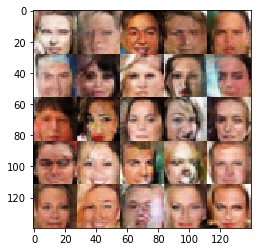

Epoch 4/5... Discriminator Loss: 0.6338... Generator Loss: 1.2248
Epoch 4/5... Discriminator Loss: 1.0221... Generator Loss: 0.8178
Epoch 4/5... Discriminator Loss: 1.3781... Generator Loss: 0.6130
Epoch 4/5... Discriminator Loss: 1.1066... Generator Loss: 2.2474
Epoch 4/5... Discriminator Loss: 0.9177... Generator Loss: 1.8157
Epoch 4/5... Discriminator Loss: 0.9161... Generator Loss: 1.6276
Epoch 4/5... Discriminator Loss: 0.7028... Generator Loss: 1.3879
Epoch 4/5... Discriminator Loss: 0.7053... Generator Loss: 1.1648
Epoch 4/5... Discriminator Loss: 0.9896... Generator Loss: 0.8447
Epoch 4/5... Discriminator Loss: 0.6577... Generator Loss: 1.6142
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


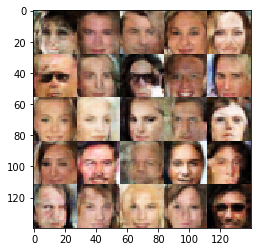

Epoch 4/5... Discriminator Loss: 0.8345... Generator Loss: 1.6178
Epoch 4/5... Discriminator Loss: 0.8882... Generator Loss: 2.3880
Epoch 4/5... Discriminator Loss: 0.6296... Generator Loss: 1.8570
Epoch 4/5... Discriminator Loss: 0.5985... Generator Loss: 1.5042
Epoch 4/5... Discriminator Loss: 0.6871... Generator Loss: 1.1297
Epoch 4/5... Discriminator Loss: 1.2091... Generator Loss: 1.6542
Epoch 4/5... Discriminator Loss: 0.6330... Generator Loss: 1.4360
Epoch 4/5... Discriminator Loss: 2.0538... Generator Loss: 0.2489
Epoch 4/5... Discriminator Loss: 0.7000... Generator Loss: 1.4287
Epoch 4/5... Discriminator Loss: 1.7142... Generator Loss: 0.4281
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


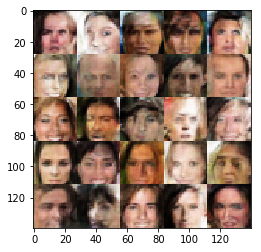

Epoch 4/5... Discriminator Loss: 1.0426... Generator Loss: 0.8773
Epoch 4/5... Discriminator Loss: 1.2005... Generator Loss: 0.5777
Epoch 4/5... Discriminator Loss: 0.6623... Generator Loss: 1.8082
Epoch 4/5... Discriminator Loss: 1.7711... Generator Loss: 0.3698
Epoch 4/5... Discriminator Loss: 0.7230... Generator Loss: 2.3440
Epoch 4/5... Discriminator Loss: 0.5854... Generator Loss: 2.0097
Epoch 4/5... Discriminator Loss: 1.0393... Generator Loss: 0.6732
Epoch 4/5... Discriminator Loss: 0.6910... Generator Loss: 1.6326
Epoch 4/5... Discriminator Loss: 0.7881... Generator Loss: 1.2713
Epoch 4/5... Discriminator Loss: 0.8881... Generator Loss: 0.9983
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


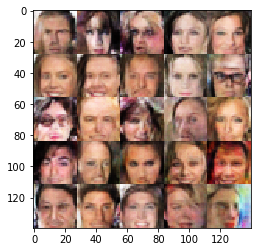

Epoch 4/5... Discriminator Loss: 1.5099... Generator Loss: 0.3938
Epoch 4/5... Discriminator Loss: 1.1184... Generator Loss: 1.6565
Epoch 4/5... Discriminator Loss: 0.8979... Generator Loss: 1.0174
Epoch 4/5... Discriminator Loss: 1.6592... Generator Loss: 0.3709
Epoch 4/5... Discriminator Loss: 1.4036... Generator Loss: 2.0979
Epoch 4/5... Discriminator Loss: 1.5391... Generator Loss: 0.5881
Epoch 4/5... Discriminator Loss: 0.8417... Generator Loss: 1.4806
Epoch 4/5... Discriminator Loss: 0.6540... Generator Loss: 1.2174
Epoch 4/5... Discriminator Loss: 1.6602... Generator Loss: 0.3486
Epoch 4/5... Discriminator Loss: 0.7872... Generator Loss: 1.5242
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


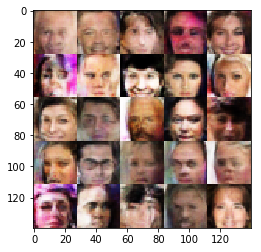

Epoch 4/5... Discriminator Loss: 1.4116... Generator Loss: 0.4613
Epoch 4/5... Discriminator Loss: 1.7971... Generator Loss: 0.3050
Epoch 4/5... Discriminator Loss: 1.0640... Generator Loss: 0.8292
Epoch 4/5... Discriminator Loss: 0.6859... Generator Loss: 1.3874
Epoch 4/5... Discriminator Loss: 2.1026... Generator Loss: 0.2092
Epoch 4/5... Discriminator Loss: 1.2686... Generator Loss: 0.5983
Epoch 4/5... Discriminator Loss: 1.0390... Generator Loss: 0.9451
Epoch 4/5... Discriminator Loss: 1.2761... Generator Loss: 0.5282
Epoch 4/5... Discriminator Loss: 0.9625... Generator Loss: 0.9559
Epoch 4/5... Discriminator Loss: 0.7053... Generator Loss: 2.2944
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


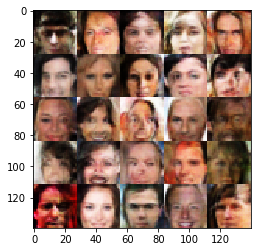

Epoch 4/5... Discriminator Loss: 0.4833... Generator Loss: 2.1553
Epoch 4/5... Discriminator Loss: 0.7016... Generator Loss: 1.9664
Epoch 4/5... Discriminator Loss: 1.6817... Generator Loss: 0.3508
Epoch 4/5... Discriminator Loss: 1.2548... Generator Loss: 2.2787
Epoch 4/5... Discriminator Loss: 0.7156... Generator Loss: 1.2231
Epoch 4/5... Discriminator Loss: 0.7943... Generator Loss: 2.0560
Epoch 4/5... Discriminator Loss: 0.9073... Generator Loss: 2.0340
Epoch 4/5... Discriminator Loss: 0.6142... Generator Loss: 1.5421
Epoch 4/5... Discriminator Loss: 1.2802... Generator Loss: 0.6698
Epoch 4/5... Discriminator Loss: 0.7627... Generator Loss: 1.4941
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


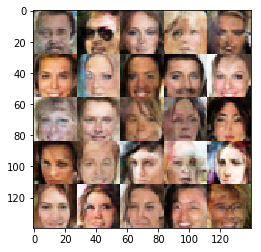

Epoch 4/5... Discriminator Loss: 0.8719... Generator Loss: 1.4796
Epoch 4/5... Discriminator Loss: 0.9464... Generator Loss: 2.9901
Epoch 4/5... Discriminator Loss: 1.0599... Generator Loss: 0.7018
Epoch 4/5... Discriminator Loss: 1.2520... Generator Loss: 0.5834
Epoch 4/5... Discriminator Loss: 1.1532... Generator Loss: 0.6941
Epoch 4/5... Discriminator Loss: 1.2769... Generator Loss: 0.5113
Epoch 4/5... Discriminator Loss: 0.8131... Generator Loss: 1.0067
Epoch 4/5... Discriminator Loss: 2.5680... Generator Loss: 3.9331
Epoch 4/5... Discriminator Loss: 1.2425... Generator Loss: 2.3093
Epoch 4/5... Discriminator Loss: 1.1783... Generator Loss: 0.7692
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


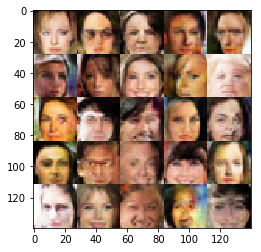

Epoch 4/5... Discriminator Loss: 0.7880... Generator Loss: 1.7962
Epoch 4/5... Discriminator Loss: 0.6336... Generator Loss: 1.4179
Epoch 4/5... Discriminator Loss: 0.8902... Generator Loss: 1.4313
Epoch 4/5... Discriminator Loss: 0.9198... Generator Loss: 1.6814
Epoch 4/5... Discriminator Loss: 1.2544... Generator Loss: 0.5862
Epoch 4/5... Discriminator Loss: 0.6548... Generator Loss: 1.1375
Epoch 4/5... Discriminator Loss: 1.1153... Generator Loss: 0.6800
Epoch 4/5... Discriminator Loss: 0.8386... Generator Loss: 0.8270
Epoch 4/5... Discriminator Loss: 0.8949... Generator Loss: 1.1049
Epoch 4/5... Discriminator Loss: 0.7369... Generator Loss: 1.8926
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


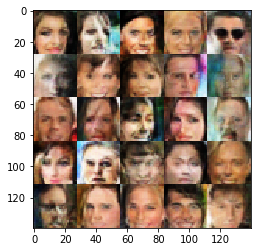

Epoch 4/5... Discriminator Loss: 1.4370... Generator Loss: 0.4574
Epoch 4/5... Discriminator Loss: 0.7789... Generator Loss: 0.9592
Epoch 4/5... Discriminator Loss: 0.5688... Generator Loss: 1.3498
Epoch 4/5... Discriminator Loss: 0.7005... Generator Loss: 2.2531
Epoch 4/5... Discriminator Loss: 0.8173... Generator Loss: 2.1970
Epoch 4/5... Discriminator Loss: 1.3272... Generator Loss: 0.5504
Epoch 4/5... Discriminator Loss: 0.9727... Generator Loss: 0.8400
Epoch 4/5... Discriminator Loss: 1.1531... Generator Loss: 0.7156
Epoch 4/5... Discriminator Loss: 1.0698... Generator Loss: 0.7645
Epoch 4/5... Discriminator Loss: 0.5894... Generator Loss: 1.8396
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


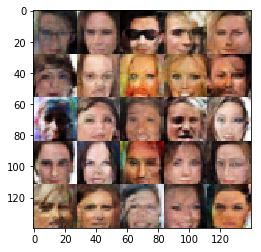

Epoch 4/5... Discriminator Loss: 1.3851... Generator Loss: 2.4286
Epoch 4/5... Discriminator Loss: 1.4638... Generator Loss: 1.0971
Epoch 4/5... Discriminator Loss: 0.7466... Generator Loss: 1.0899
Epoch 4/5... Discriminator Loss: 0.8736... Generator Loss: 1.4403
Epoch 4/5... Discriminator Loss: 0.6392... Generator Loss: 2.4670
Epoch 4/5... Discriminator Loss: 0.8102... Generator Loss: 1.4779
Epoch 4/5... Discriminator Loss: 0.7129... Generator Loss: 1.5872
Epoch 4/5... Discriminator Loss: 0.6224... Generator Loss: 2.1110
Epoch 4/5... Discriminator Loss: 0.9800... Generator Loss: 0.7444
Epoch 4/5... Discriminator Loss: 0.8646... Generator Loss: 1.7532
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


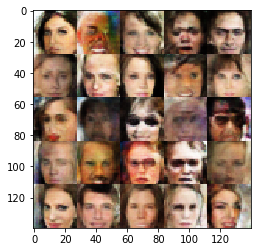

Epoch 4/5... Discriminator Loss: 1.6232... Generator Loss: 2.5104
Epoch 4/5... Discriminator Loss: 1.2391... Generator Loss: 0.6240
Epoch 4/5... Discriminator Loss: 0.7823... Generator Loss: 1.3526
Epoch 4/5... Discriminator Loss: 1.4034... Generator Loss: 0.5840
Epoch 4/5... Discriminator Loss: 0.9041... Generator Loss: 1.5433
Epoch 4/5... Discriminator Loss: 0.6959... Generator Loss: 1.3570
Epoch 4/5... Discriminator Loss: 0.7996... Generator Loss: 1.6826
Epoch 4/5... Discriminator Loss: 0.8273... Generator Loss: 3.1946
Epoch 4/5... Discriminator Loss: 0.7043... Generator Loss: 1.5487
Epoch 4/5... Discriminator Loss: 1.1168... Generator Loss: 0.7029
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


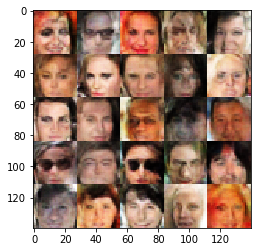

Epoch 4/5... Discriminator Loss: 1.2724... Generator Loss: 0.6585
Epoch 4/5... Discriminator Loss: 0.5001... Generator Loss: 1.8582
Epoch 4/5... Discriminator Loss: 0.5183... Generator Loss: 2.3729
Epoch 4/5... Discriminator Loss: 0.8171... Generator Loss: 1.0481
Epoch 4/5... Discriminator Loss: 1.1831... Generator Loss: 0.5939
Epoch 4/5... Discriminator Loss: 0.6690... Generator Loss: 1.9735
Epoch 4/5... Discriminator Loss: 1.9660... Generator Loss: 0.2617
Epoch 4/5... Discriminator Loss: 0.7219... Generator Loss: 1.6916
Epoch 4/5... Discriminator Loss: 0.6544... Generator Loss: 1.5800
Epoch 4/5... Discriminator Loss: 1.3862... Generator Loss: 0.4747
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


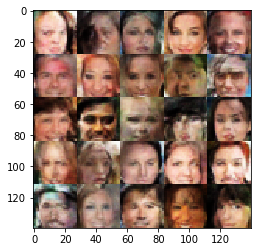

Epoch 4/5... Discriminator Loss: 0.7369... Generator Loss: 1.1719
Epoch 4/5... Discriminator Loss: 0.6237... Generator Loss: 2.3506
Epoch 4/5... Discriminator Loss: 0.6893... Generator Loss: 1.2152
Epoch 4/5... Discriminator Loss: 1.1428... Generator Loss: 0.6258
Epoch 4/5... Discriminator Loss: 0.8642... Generator Loss: 0.9955
Epoch 4/5... Discriminator Loss: 0.7558... Generator Loss: 1.7660
Epoch 4/5... Discriminator Loss: 1.1603... Generator Loss: 2.4675
Epoch 4/5... Discriminator Loss: 0.6284... Generator Loss: 1.8433
Epoch 4/5... Discriminator Loss: 1.0015... Generator Loss: 1.5345
Epoch 4/5... Discriminator Loss: 0.7072... Generator Loss: 1.4566
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


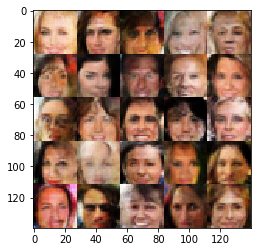

Epoch 4/5... Discriminator Loss: 0.6224... Generator Loss: 1.5435
Epoch 4/5... Discriminator Loss: 0.7418... Generator Loss: 1.2533
Epoch 4/5... Discriminator Loss: 1.5263... Generator Loss: 0.4823
Epoch 4/5... Discriminator Loss: 0.7091... Generator Loss: 1.1824
Epoch 4/5... Discriminator Loss: 1.2326... Generator Loss: 0.5326
Epoch 4/5... Discriminator Loss: 0.6750... Generator Loss: 1.1666
Epoch 4/5... Discriminator Loss: 1.2913... Generator Loss: 0.4962
Epoch 4/5... Discriminator Loss: 2.7284... Generator Loss: 0.1869
Epoch 4/5... Discriminator Loss: 0.8286... Generator Loss: 1.1498
Epoch 4/5... Discriminator Loss: 0.9466... Generator Loss: 0.8240
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


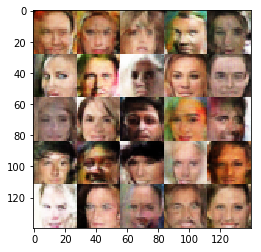

Epoch 4/5... Discriminator Loss: 0.7978... Generator Loss: 1.1370
Epoch 4/5... Discriminator Loss: 1.1785... Generator Loss: 2.8906
Epoch 4/5... Discriminator Loss: 0.7495... Generator Loss: 1.6077
Epoch 4/5... Discriminator Loss: 1.7539... Generator Loss: 0.3255
Epoch 4/5... Discriminator Loss: 1.1847... Generator Loss: 0.6848
Epoch 4/5... Discriminator Loss: 1.1523... Generator Loss: 0.7430
Epoch 4/5... Discriminator Loss: 1.0360... Generator Loss: 2.0888
Epoch 4/5... Discriminator Loss: 0.7573... Generator Loss: 1.7492
Epoch 4/5... Discriminator Loss: 1.5510... Generator Loss: 0.4419
Epoch 4/5... Discriminator Loss: 0.8994... Generator Loss: 1.3228
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


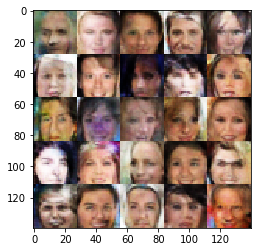

Epoch 4/5... Discriminator Loss: 0.9661... Generator Loss: 3.2677
Epoch 4/5... Discriminator Loss: 0.6577... Generator Loss: 1.4468
Epoch 4/5... Discriminator Loss: 0.9711... Generator Loss: 0.7224
Epoch 4/5... Discriminator Loss: 1.3998... Generator Loss: 0.4520
Epoch 4/5... Discriminator Loss: 2.0213... Generator Loss: 0.4039
Epoch 4/5... Discriminator Loss: 0.9295... Generator Loss: 1.5934
Epoch 4/5... Discriminator Loss: 0.8973... Generator Loss: 1.6743
Epoch 4/5... Discriminator Loss: 1.4178... Generator Loss: 0.5547
Epoch 4/5... Discriminator Loss: 1.0157... Generator Loss: 0.8051
Epoch 4/5... Discriminator Loss: 1.6697... Generator Loss: 0.3695
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


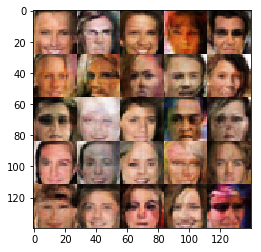

Epoch 4/5... Discriminator Loss: 1.3007... Generator Loss: 0.4467
Epoch 4/5... Discriminator Loss: 0.6918... Generator Loss: 3.5487
Epoch 4/5... Discriminator Loss: 1.8736... Generator Loss: 4.2715
Epoch 4/5... Discriminator Loss: 1.2198... Generator Loss: 0.5971
Epoch 4/5... Discriminator Loss: 1.3609... Generator Loss: 0.4680
Epoch 4/5... Discriminator Loss: 1.2354... Generator Loss: 0.6122
Epoch 4/5... Discriminator Loss: 1.6314... Generator Loss: 0.3509
Epoch 4/5... Discriminator Loss: 0.6451... Generator Loss: 2.0477
Epoch 4/5... Discriminator Loss: 0.8728... Generator Loss: 1.2212
Epoch 4/5... Discriminator Loss: 1.2002... Generator Loss: 0.5562
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


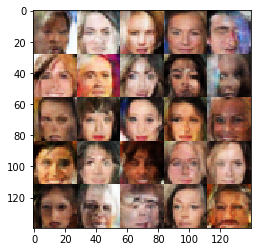

Epoch 4/5... Discriminator Loss: 1.5819... Generator Loss: 2.5179
Epoch 4/5... Discriminator Loss: 0.9435... Generator Loss: 0.9678
Epoch 4/5... Discriminator Loss: 0.9208... Generator Loss: 1.0854
Epoch 4/5... Discriminator Loss: 0.7083... Generator Loss: 2.4371
Epoch 4/5... Discriminator Loss: 0.9670... Generator Loss: 0.8352
Epoch 4/5... Discriminator Loss: 1.5272... Generator Loss: 0.4442
Epoch 4/5... Discriminator Loss: 0.7175... Generator Loss: 1.2665
Epoch 4/5... Discriminator Loss: 0.8932... Generator Loss: 0.8841
Epoch 4/5... Discriminator Loss: 1.5127... Generator Loss: 0.3847
Epoch 4/5... Discriminator Loss: 0.9439... Generator Loss: 0.8393
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


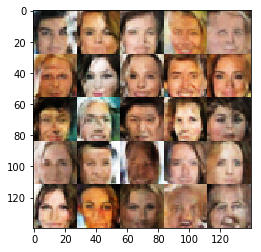

Epoch 4/5... Discriminator Loss: 0.9543... Generator Loss: 2.5705
Epoch 4/5... Discriminator Loss: 0.7914... Generator Loss: 0.9296
Epoch 4/5... Discriminator Loss: 1.4915... Generator Loss: 0.4379
Epoch 4/5... Discriminator Loss: 1.5002... Generator Loss: 2.3855
Epoch 4/5... Discriminator Loss: 0.9819... Generator Loss: 2.0262
Epoch 4/5... Discriminator Loss: 0.7856... Generator Loss: 1.0043
Epoch 4/5... Discriminator Loss: 0.4742... Generator Loss: 1.8355
Epoch 4/5... Discriminator Loss: 1.6357... Generator Loss: 0.3952
Epoch 4/5... Discriminator Loss: 0.8791... Generator Loss: 1.6259
Epoch 4/5... Discriminator Loss: 0.8902... Generator Loss: 0.9187
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


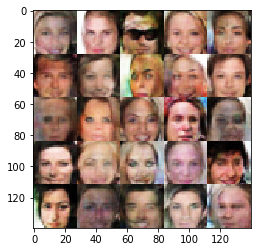

Epoch 4/5... Discriminator Loss: 0.9594... Generator Loss: 1.7988
Epoch 4/5... Discriminator Loss: 1.3537... Generator Loss: 0.5612
Epoch 4/5... Discriminator Loss: 1.0081... Generator Loss: 0.7760
Epoch 4/5... Discriminator Loss: 0.5208... Generator Loss: 1.6153
Epoch 4/5... Discriminator Loss: 1.3485... Generator Loss: 0.5461
Epoch 4/5... Discriminator Loss: 0.8180... Generator Loss: 1.0457
Epoch 4/5... Discriminator Loss: 0.7779... Generator Loss: 1.1898
Epoch 4/5... Discriminator Loss: 0.6514... Generator Loss: 1.3765
Epoch 4/5... Discriminator Loss: 0.5438... Generator Loss: 1.7972
Epoch 4/5... Discriminator Loss: 0.6600... Generator Loss: 1.5061
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


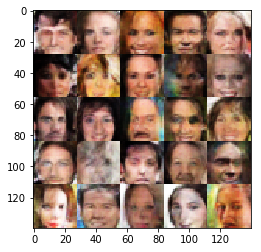

Epoch 4/5... Discriminator Loss: 1.4046... Generator Loss: 0.4772
Epoch 4/5... Discriminator Loss: 0.8708... Generator Loss: 1.7264
Epoch 4/5... Discriminator Loss: 0.6053... Generator Loss: 1.8679
Epoch 4/5... Discriminator Loss: 0.8531... Generator Loss: 1.6099
Epoch 4/5... Discriminator Loss: 0.9754... Generator Loss: 0.9640
Epoch 4/5... Discriminator Loss: 0.7822... Generator Loss: 1.6745
Epoch 4/5... Discriminator Loss: 1.7301... Generator Loss: 0.3045
Epoch 4/5... Discriminator Loss: 0.8242... Generator Loss: 1.5135
Epoch 4/5... Discriminator Loss: 0.6923... Generator Loss: 2.5579
Epoch 4/5... Discriminator Loss: 0.6035... Generator Loss: 1.5750
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


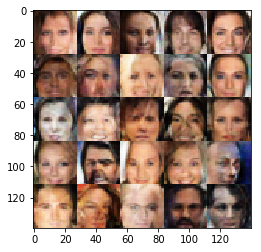

Epoch 4/5... Discriminator Loss: 1.2952... Generator Loss: 0.6043
Epoch 4/5... Discriminator Loss: 0.5589... Generator Loss: 1.8150
Epoch 4/5... Discriminator Loss: 0.9706... Generator Loss: 3.3459
Epoch 4/5... Discriminator Loss: 1.5433... Generator Loss: 0.4641
Epoch 4/5... Discriminator Loss: 0.6344... Generator Loss: 1.8519
Epoch 4/5... Discriminator Loss: 1.0215... Generator Loss: 1.8382
Epoch 4/5... Discriminator Loss: 0.7548... Generator Loss: 1.2422
Epoch 4/5... Discriminator Loss: 0.7296... Generator Loss: 1.4662
Epoch 4/5... Discriminator Loss: 0.8435... Generator Loss: 0.9300
Epoch 4/5... Discriminator Loss: 3.1767... Generator Loss: 3.6837
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


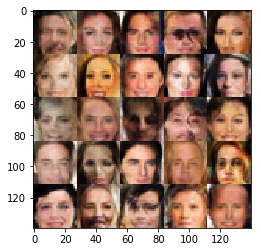

Epoch 4/5... Discriminator Loss: 0.9556... Generator Loss: 1.3226
Epoch 4/5... Discriminator Loss: 1.3640... Generator Loss: 2.0162
Epoch 4/5... Discriminator Loss: 0.9470... Generator Loss: 1.6596
Epoch 4/5... Discriminator Loss: 0.8988... Generator Loss: 1.3350
Epoch 4/5... Discriminator Loss: 1.4084... Generator Loss: 0.4087
Epoch 4/5... Discriminator Loss: 1.3940... Generator Loss: 0.4475
Epoch 4/5... Discriminator Loss: 1.1351... Generator Loss: 0.7269
Epoch 4/5... Discriminator Loss: 0.7746... Generator Loss: 1.4644
Epoch 4/5... Discriminator Loss: 0.7452... Generator Loss: 1.3426
Epoch 4/5... Discriminator Loss: 1.0618... Generator Loss: 0.7790
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


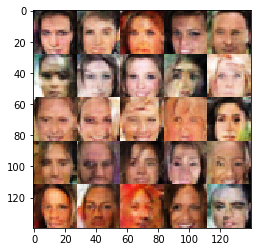

Epoch 4/5... Discriminator Loss: 1.3134... Generator Loss: 0.5179
Epoch 4/5... Discriminator Loss: 0.6105... Generator Loss: 1.6170
Epoch 4/5... Discriminator Loss: 1.8000... Generator Loss: 2.7395
Epoch 4/5... Discriminator Loss: 1.1645... Generator Loss: 0.6620
Epoch 4/5... Discriminator Loss: 1.2126... Generator Loss: 3.3075
Epoch 4/5... Discriminator Loss: 1.1935... Generator Loss: 0.5691
Epoch 4/5... Discriminator Loss: 0.8130... Generator Loss: 1.2204
Epoch 4/5... Discriminator Loss: 1.0662... Generator Loss: 0.6734
Epoch 4/5... Discriminator Loss: 0.8916... Generator Loss: 1.0785
Epoch 4/5... Discriminator Loss: 0.8015... Generator Loss: 0.9898
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


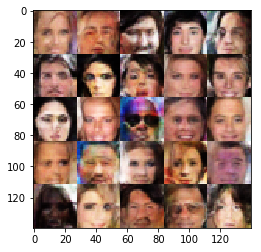

Epoch 4/5... Discriminator Loss: 0.7234... Generator Loss: 1.4540
Epoch 4/5... Discriminator Loss: 1.0133... Generator Loss: 1.8131
Epoch 4/5... Discriminator Loss: 0.9352... Generator Loss: 0.7672
Epoch 4/5... Discriminator Loss: 1.3119... Generator Loss: 0.5146
Epoch 4/5... Discriminator Loss: 0.8361... Generator Loss: 0.9837
Epoch 4/5... Discriminator Loss: 0.7779... Generator Loss: 2.2578
Epoch 4/5... Discriminator Loss: 0.8482... Generator Loss: 1.0362
Epoch 4/5... Discriminator Loss: 0.8059... Generator Loss: 1.0691
Epoch 4/5... Discriminator Loss: 1.6137... Generator Loss: 0.3692
Epoch 4/5... Discriminator Loss: 1.4285... Generator Loss: 0.5803
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


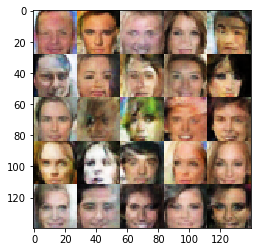

Epoch 4/5... Discriminator Loss: 0.7489... Generator Loss: 1.7000
Epoch 4/5... Discriminator Loss: 0.9309... Generator Loss: 0.7790
Epoch 4/5... Discriminator Loss: 0.8867... Generator Loss: 1.4454
Epoch 4/5... Discriminator Loss: 1.5649... Generator Loss: 0.3820
Epoch 4/5... Discriminator Loss: 1.3128... Generator Loss: 2.5902
Epoch 4/5... Discriminator Loss: 1.6030... Generator Loss: 0.3766
Epoch 4/5... Discriminator Loss: 1.0511... Generator Loss: 0.8777
Epoch 4/5... Discriminator Loss: 0.8369... Generator Loss: 1.4408
Epoch 4/5... Discriminator Loss: 0.7786... Generator Loss: 1.4554
Epoch 4/5... Discriminator Loss: 1.0555... Generator Loss: 0.9021
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


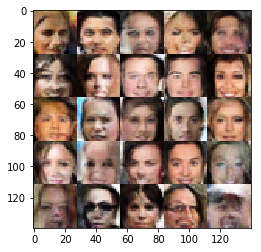

Epoch 4/5... Discriminator Loss: 0.6064... Generator Loss: 1.3581
Epoch 4/5... Discriminator Loss: 1.2168... Generator Loss: 0.5522
Epoch 4/5... Discriminator Loss: 0.6706... Generator Loss: 1.4642
Epoch 4/5... Discriminator Loss: 0.7041... Generator Loss: 1.7665
Epoch 4/5... Discriminator Loss: 0.4802... Generator Loss: 2.0404
Epoch 4/5... Discriminator Loss: 0.5195... Generator Loss: 1.8294
Epoch 4/5... Discriminator Loss: 1.6764... Generator Loss: 0.3573
Epoch 4/5... Discriminator Loss: 1.6579... Generator Loss: 0.3533
Epoch 4/5... Discriminator Loss: 0.8878... Generator Loss: 0.8928
Epoch 4/5... Discriminator Loss: 0.8579... Generator Loss: 0.9372
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


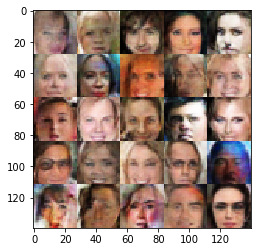

Epoch 4/5... Discriminator Loss: 1.0497... Generator Loss: 0.7067
Epoch 4/5... Discriminator Loss: 0.6432... Generator Loss: 2.1799
Epoch 4/5... Discriminator Loss: 1.8841... Generator Loss: 0.3012
Epoch 4/5... Discriminator Loss: 0.7247... Generator Loss: 1.1251
Epoch 4/5... Discriminator Loss: 1.5129... Generator Loss: 0.5451
Epoch 4/5... Discriminator Loss: 0.7003... Generator Loss: 1.5011
Epoch 4/5... Discriminator Loss: 1.2066... Generator Loss: 0.5828
Epoch 4/5... Discriminator Loss: 1.9765... Generator Loss: 0.2401
Epoch 4/5... Discriminator Loss: 0.6551... Generator Loss: 1.4273
Epoch 4/5... Discriminator Loss: 1.2870... Generator Loss: 0.4751
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


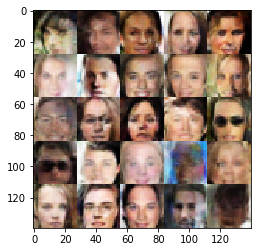

Epoch 4/5... Discriminator Loss: 0.9240... Generator Loss: 1.2090
Epoch 4/5... Discriminator Loss: 0.6236... Generator Loss: 1.5139
Epoch 4/5... Discriminator Loss: 1.6840... Generator Loss: 0.5837
Epoch 4/5... Discriminator Loss: 1.0831... Generator Loss: 0.6969
Epoch 4/5... Discriminator Loss: 1.1631... Generator Loss: 0.6598
Epoch 4/5... Discriminator Loss: 1.3286... Generator Loss: 2.8167
Epoch 4/5... Discriminator Loss: 0.5684... Generator Loss: 1.9966
Epoch 4/5... Discriminator Loss: 1.0156... Generator Loss: 0.7747
Epoch 4/5... Discriminator Loss: 0.6147... Generator Loss: 1.3465
Epoch 4/5... Discriminator Loss: 1.0508... Generator Loss: 2.7944
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


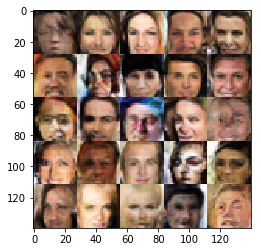

Epoch 4/5... Discriminator Loss: 1.2765... Generator Loss: 0.5748
Epoch 4/5... Discriminator Loss: 0.8156... Generator Loss: 0.9231
Epoch 4/5... Discriminator Loss: 1.2272... Generator Loss: 2.2587
Epoch 4/5... Discriminator Loss: 0.6467... Generator Loss: 1.2889
Epoch 4/5... Discriminator Loss: 2.0379... Generator Loss: 0.2235
Epoch 4/5... Discriminator Loss: 1.4822... Generator Loss: 0.4204
Epoch 5/5... Discriminator Loss: 1.2182... Generator Loss: 0.5704
Epoch 5/5... Discriminator Loss: 1.9286... Generator Loss: 0.3439
Epoch 5/5... Discriminator Loss: 1.1620... Generator Loss: 0.8240
Epoch 5/5... Discriminator Loss: 1.5546... Generator Loss: 0.4432
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


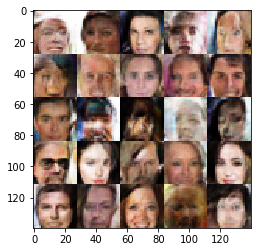

Epoch 5/5... Discriminator Loss: 1.3279... Generator Loss: 3.0132
Epoch 5/5... Discriminator Loss: 0.5029... Generator Loss: 1.6600
Epoch 5/5... Discriminator Loss: 1.4230... Generator Loss: 0.4857
Epoch 5/5... Discriminator Loss: 1.6080... Generator Loss: 0.4135
Epoch 5/5... Discriminator Loss: 1.6436... Generator Loss: 0.3731
Epoch 5/5... Discriminator Loss: 0.8896... Generator Loss: 0.8983
Epoch 5/5... Discriminator Loss: 0.4921... Generator Loss: 1.8389
Epoch 5/5... Discriminator Loss: 0.6891... Generator Loss: 1.3228
Epoch 5/5... Discriminator Loss: 1.8805... Generator Loss: 0.2835
Epoch 5/5... Discriminator Loss: 0.7266... Generator Loss: 2.0551
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


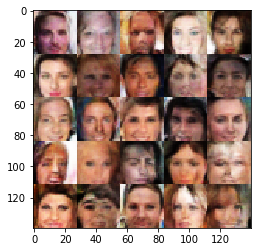

Epoch 5/5... Discriminator Loss: 1.6718... Generator Loss: 0.3492
Epoch 5/5... Discriminator Loss: 1.1433... Generator Loss: 0.6463
Epoch 5/5... Discriminator Loss: 1.1201... Generator Loss: 0.6362
Epoch 5/5... Discriminator Loss: 1.3494... Generator Loss: 0.5413
Epoch 5/5... Discriminator Loss: 0.4854... Generator Loss: 1.8839
Epoch 5/5... Discriminator Loss: 0.6777... Generator Loss: 1.8899
Epoch 5/5... Discriminator Loss: 1.1605... Generator Loss: 3.3331
Epoch 5/5... Discriminator Loss: 1.1617... Generator Loss: 1.8826
Epoch 5/5... Discriminator Loss: 0.7531... Generator Loss: 1.7083
Epoch 5/5... Discriminator Loss: 1.5391... Generator Loss: 2.0092
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


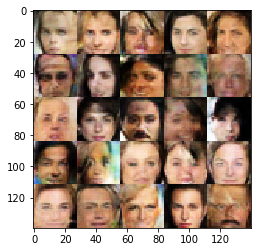

Epoch 5/5... Discriminator Loss: 0.9104... Generator Loss: 1.4248
Epoch 5/5... Discriminator Loss: 0.8286... Generator Loss: 1.1688
Epoch 5/5... Discriminator Loss: 1.1863... Generator Loss: 0.7874
Epoch 5/5... Discriminator Loss: 1.9642... Generator Loss: 0.2603
Epoch 5/5... Discriminator Loss: 1.0801... Generator Loss: 0.6976
Epoch 5/5... Discriminator Loss: 0.6347... Generator Loss: 1.5227
Epoch 5/5... Discriminator Loss: 0.9373... Generator Loss: 0.9530
Epoch 5/5... Discriminator Loss: 0.6111... Generator Loss: 1.7725
Epoch 5/5... Discriminator Loss: 1.0639... Generator Loss: 0.7586
Epoch 5/5... Discriminator Loss: 0.8924... Generator Loss: 2.6487
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


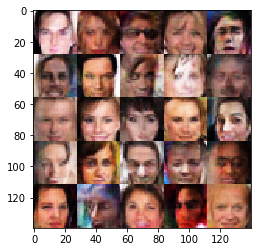

Epoch 5/5... Discriminator Loss: 0.6821... Generator Loss: 1.1904
Epoch 5/5... Discriminator Loss: 0.8768... Generator Loss: 0.8474
Epoch 5/5... Discriminator Loss: 1.6370... Generator Loss: 0.3334
Epoch 5/5... Discriminator Loss: 1.0552... Generator Loss: 2.2310
Epoch 5/5... Discriminator Loss: 0.8580... Generator Loss: 2.4791
Epoch 5/5... Discriminator Loss: 1.1069... Generator Loss: 0.7532
Epoch 5/5... Discriminator Loss: 0.5864... Generator Loss: 1.5939
Epoch 5/5... Discriminator Loss: 0.6858... Generator Loss: 1.1939
Epoch 5/5... Discriminator Loss: 1.6990... Generator Loss: 0.3812
Epoch 5/5... Discriminator Loss: 0.8177... Generator Loss: 1.0332
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


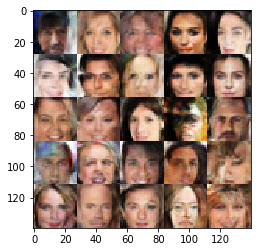

Epoch 5/5... Discriminator Loss: 1.4408... Generator Loss: 0.4207
Epoch 5/5... Discriminator Loss: 1.0372... Generator Loss: 0.8353
Epoch 5/5... Discriminator Loss: 2.3155... Generator Loss: 0.1993
Epoch 5/5... Discriminator Loss: 1.2023... Generator Loss: 0.5794
Epoch 5/5... Discriminator Loss: 1.1917... Generator Loss: 0.6071
Epoch 5/5... Discriminator Loss: 0.9090... Generator Loss: 0.8833
Epoch 5/5... Discriminator Loss: 1.2249... Generator Loss: 0.5986
Epoch 5/5... Discriminator Loss: 1.5535... Generator Loss: 1.3373
Epoch 5/5... Discriminator Loss: 0.8030... Generator Loss: 1.0395
Epoch 5/5... Discriminator Loss: 1.0129... Generator Loss: 0.7447
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


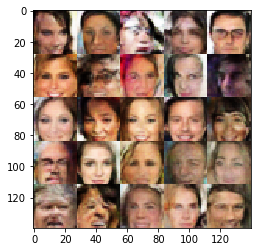

Epoch 5/5... Discriminator Loss: 1.1695... Generator Loss: 2.1489
Epoch 5/5... Discriminator Loss: 0.8873... Generator Loss: 1.8758
Epoch 5/5... Discriminator Loss: 0.7737... Generator Loss: 1.4876
Epoch 5/5... Discriminator Loss: 1.1062... Generator Loss: 0.8216
Epoch 5/5... Discriminator Loss: 1.0428... Generator Loss: 0.8085
Epoch 5/5... Discriminator Loss: 0.7203... Generator Loss: 1.9145
Epoch 5/5... Discriminator Loss: 0.7477... Generator Loss: 1.1807
Epoch 5/5... Discriminator Loss: 0.9219... Generator Loss: 1.5952
Epoch 5/5... Discriminator Loss: 1.4544... Generator Loss: 2.4504
Epoch 5/5... Discriminator Loss: 1.4845... Generator Loss: 0.4703
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


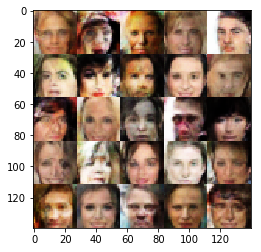

Epoch 5/5... Discriminator Loss: 1.0049... Generator Loss: 0.9959
Epoch 5/5... Discriminator Loss: 1.0179... Generator Loss: 0.8048
Epoch 5/5... Discriminator Loss: 1.3649... Generator Loss: 0.4485
Epoch 5/5... Discriminator Loss: 0.6065... Generator Loss: 1.3315
Epoch 5/5... Discriminator Loss: 1.0640... Generator Loss: 0.8134
Epoch 5/5... Discriminator Loss: 0.7254... Generator Loss: 1.2680
Epoch 5/5... Discriminator Loss: 1.1429... Generator Loss: 0.6649
Epoch 5/5... Discriminator Loss: 1.1272... Generator Loss: 0.8648
Epoch 5/5... Discriminator Loss: 1.8644... Generator Loss: 0.2971
Epoch 5/5... Discriminator Loss: 1.3048... Generator Loss: 0.5248
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


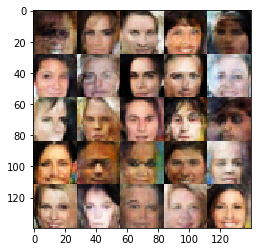

Epoch 5/5... Discriminator Loss: 0.9148... Generator Loss: 1.1844
Epoch 5/5... Discriminator Loss: 1.6363... Generator Loss: 0.3901
Epoch 5/5... Discriminator Loss: 1.2305... Generator Loss: 0.6082
Epoch 5/5... Discriminator Loss: 0.7381... Generator Loss: 2.8273
Epoch 5/5... Discriminator Loss: 0.7785... Generator Loss: 1.3557
Epoch 5/5... Discriminator Loss: 1.2464... Generator Loss: 0.5774
Epoch 5/5... Discriminator Loss: 0.7260... Generator Loss: 1.4391
Epoch 5/5... Discriminator Loss: 0.6855... Generator Loss: 1.6975
Epoch 5/5... Discriminator Loss: 0.9238... Generator Loss: 0.8784
Epoch 5/5... Discriminator Loss: 0.9967... Generator Loss: 0.8822
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


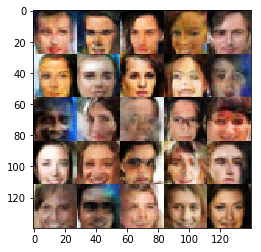

Epoch 5/5... Discriminator Loss: 0.6526... Generator Loss: 1.4738
Epoch 5/5... Discriminator Loss: 2.0131... Generator Loss: 3.6564
Epoch 5/5... Discriminator Loss: 0.6463... Generator Loss: 1.8084
Epoch 5/5... Discriminator Loss: 1.3151... Generator Loss: 1.1411
Epoch 5/5... Discriminator Loss: 0.9498... Generator Loss: 1.2369
Epoch 5/5... Discriminator Loss: 0.6444... Generator Loss: 1.7801
Epoch 5/5... Discriminator Loss: 2.0306... Generator Loss: 0.2481
Epoch 5/5... Discriminator Loss: 1.8931... Generator Loss: 0.3048
Epoch 5/5... Discriminator Loss: 0.7461... Generator Loss: 1.2363
Epoch 5/5... Discriminator Loss: 0.8164... Generator Loss: 0.9829
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


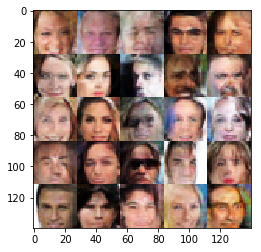

Epoch 5/5... Discriminator Loss: 1.3613... Generator Loss: 0.5097
Epoch 5/5... Discriminator Loss: 1.0252... Generator Loss: 0.8422
Epoch 5/5... Discriminator Loss: 0.7393... Generator Loss: 1.2387
Epoch 5/5... Discriminator Loss: 1.4342... Generator Loss: 0.4628
Epoch 5/5... Discriminator Loss: 0.7449... Generator Loss: 1.8779
Epoch 5/5... Discriminator Loss: 0.8297... Generator Loss: 1.4220
Epoch 5/5... Discriminator Loss: 0.7412... Generator Loss: 1.3135
Epoch 5/5... Discriminator Loss: 2.1117... Generator Loss: 0.2165
Epoch 5/5... Discriminator Loss: 1.6674... Generator Loss: 0.3988
Epoch 5/5... Discriminator Loss: 0.6094... Generator Loss: 1.4470
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


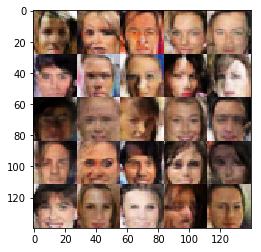

Epoch 5/5... Discriminator Loss: 0.7685... Generator Loss: 1.2487
Epoch 5/5... Discriminator Loss: 0.6951... Generator Loss: 1.4947
Epoch 5/5... Discriminator Loss: 0.8945... Generator Loss: 1.1977
Epoch 5/5... Discriminator Loss: 0.7112... Generator Loss: 1.2326
Epoch 5/5... Discriminator Loss: 2.5233... Generator Loss: 3.8477
Epoch 5/5... Discriminator Loss: 1.5458... Generator Loss: 1.0048
Epoch 5/5... Discriminator Loss: 1.1264... Generator Loss: 0.8461
Epoch 5/5... Discriminator Loss: 0.8022... Generator Loss: 1.4068
Epoch 5/5... Discriminator Loss: 1.1231... Generator Loss: 0.6745
Epoch 5/5... Discriminator Loss: 0.8936... Generator Loss: 1.2265
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


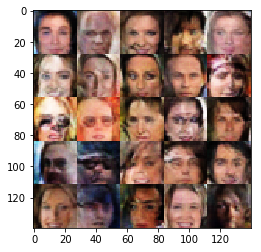

Epoch 5/5... Discriminator Loss: 0.5811... Generator Loss: 1.7873
Epoch 5/5... Discriminator Loss: 0.8235... Generator Loss: 0.9882
Epoch 5/5... Discriminator Loss: 0.7666... Generator Loss: 1.0137
Epoch 5/5... Discriminator Loss: 0.7535... Generator Loss: 1.3639
Epoch 5/5... Discriminator Loss: 1.2068... Generator Loss: 0.8108
Epoch 5/5... Discriminator Loss: 1.3479... Generator Loss: 0.4285
Epoch 5/5... Discriminator Loss: 1.6552... Generator Loss: 0.3632
Epoch 5/5... Discriminator Loss: 0.9603... Generator Loss: 0.8472
Epoch 5/5... Discriminator Loss: 1.4075... Generator Loss: 0.4612
Epoch 5/5... Discriminator Loss: 0.7115... Generator Loss: 1.4113
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


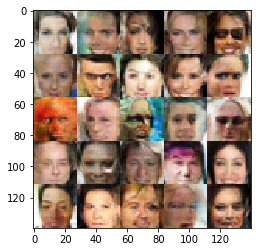

Epoch 5/5... Discriminator Loss: 0.7594... Generator Loss: 0.8912
Epoch 5/5... Discriminator Loss: 0.9775... Generator Loss: 2.0726
Epoch 5/5... Discriminator Loss: 0.9396... Generator Loss: 1.2466
Epoch 5/5... Discriminator Loss: 0.9975... Generator Loss: 0.6895
Epoch 5/5... Discriminator Loss: 0.6638... Generator Loss: 1.1562
Epoch 5/5... Discriminator Loss: 0.8387... Generator Loss: 1.0173
Epoch 5/5... Discriminator Loss: 0.8766... Generator Loss: 0.9968
Epoch 5/5... Discriminator Loss: 1.5902... Generator Loss: 0.4566
Epoch 5/5... Discriminator Loss: 1.1549... Generator Loss: 0.8193
Epoch 5/5... Discriminator Loss: 0.9166... Generator Loss: 0.9318
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


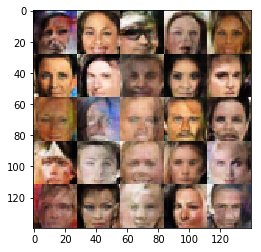

Epoch 5/5... Discriminator Loss: 1.9348... Generator Loss: 0.3212
Epoch 5/5... Discriminator Loss: 0.6634... Generator Loss: 1.7777
Epoch 5/5... Discriminator Loss: 0.8531... Generator Loss: 1.3906
Epoch 5/5... Discriminator Loss: 1.8027... Generator Loss: 0.3085
Epoch 5/5... Discriminator Loss: 0.6768... Generator Loss: 1.4398
Epoch 5/5... Discriminator Loss: 0.7002... Generator Loss: 1.6858
Epoch 5/5... Discriminator Loss: 0.7543... Generator Loss: 1.3490
Epoch 5/5... Discriminator Loss: 0.7306... Generator Loss: 1.0772
Epoch 5/5... Discriminator Loss: 0.9498... Generator Loss: 0.9059
Epoch 5/5... Discriminator Loss: 0.5798... Generator Loss: 3.6208
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


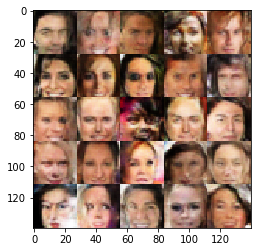

Epoch 5/5... Discriminator Loss: 0.7192... Generator Loss: 1.5532
Epoch 5/5... Discriminator Loss: 1.3310... Generator Loss: 0.5135
Epoch 5/5... Discriminator Loss: 0.6165... Generator Loss: 1.9737
Epoch 5/5... Discriminator Loss: 0.7028... Generator Loss: 2.3971
Epoch 5/5... Discriminator Loss: 0.8045... Generator Loss: 1.2866
Epoch 5/5... Discriminator Loss: 0.5671... Generator Loss: 1.5015
Epoch 5/5... Discriminator Loss: 0.5603... Generator Loss: 2.2071
Epoch 5/5... Discriminator Loss: 1.3246... Generator Loss: 0.5229
Epoch 5/5... Discriminator Loss: 1.4316... Generator Loss: 0.4918
Epoch 5/5... Discriminator Loss: 1.1673... Generator Loss: 0.7120
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


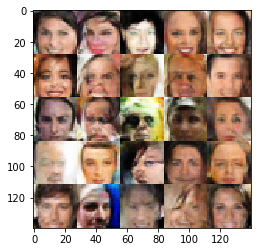

Epoch 5/5... Discriminator Loss: 1.5787... Generator Loss: 2.3280
Epoch 5/5... Discriminator Loss: 1.0037... Generator Loss: 0.8851
Epoch 5/5... Discriminator Loss: 0.4993... Generator Loss: 1.7634
Epoch 5/5... Discriminator Loss: 2.6310... Generator Loss: 0.1500
Epoch 5/5... Discriminator Loss: 0.7770... Generator Loss: 1.3855
Epoch 5/5... Discriminator Loss: 1.4536... Generator Loss: 0.4465
Epoch 5/5... Discriminator Loss: 1.5977... Generator Loss: 0.3661
Epoch 5/5... Discriminator Loss: 0.9280... Generator Loss: 0.8707
Epoch 5/5... Discriminator Loss: 1.3479... Generator Loss: 0.6770
Epoch 5/5... Discriminator Loss: 1.6005... Generator Loss: 0.4126
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


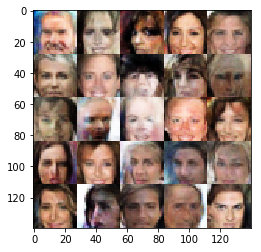

Epoch 5/5... Discriminator Loss: 2.7585... Generator Loss: 4.4493
Epoch 5/5... Discriminator Loss: 0.8212... Generator Loss: 1.0563
Epoch 5/5... Discriminator Loss: 0.6681... Generator Loss: 1.1938
Epoch 5/5... Discriminator Loss: 0.9183... Generator Loss: 1.1580
Epoch 5/5... Discriminator Loss: 1.3958... Generator Loss: 2.2616
Epoch 5/5... Discriminator Loss: 0.9474... Generator Loss: 1.1599
Epoch 5/5... Discriminator Loss: 0.7359... Generator Loss: 1.5705
Epoch 5/5... Discriminator Loss: 0.8787... Generator Loss: 0.9248
Epoch 5/5... Discriminator Loss: 1.1420... Generator Loss: 0.6688
Epoch 5/5... Discriminator Loss: 0.6164... Generator Loss: 1.8133
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


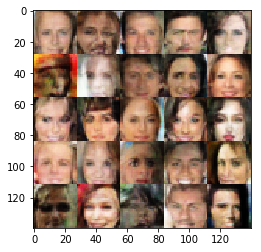

Epoch 5/5... Discriminator Loss: 1.0669... Generator Loss: 0.9285
Epoch 5/5... Discriminator Loss: 1.2262... Generator Loss: 2.3148
Epoch 5/5... Discriminator Loss: 1.6541... Generator Loss: 0.3272
Epoch 5/5... Discriminator Loss: 1.4196... Generator Loss: 0.4621
Epoch 5/5... Discriminator Loss: 1.2737... Generator Loss: 1.2758
Epoch 5/5... Discriminator Loss: 0.9468... Generator Loss: 1.0147
Epoch 5/5... Discriminator Loss: 0.8370... Generator Loss: 0.9775
Epoch 5/5... Discriminator Loss: 1.4055... Generator Loss: 0.5344
Epoch 5/5... Discriminator Loss: 1.5007... Generator Loss: 0.4044
Epoch 5/5... Discriminator Loss: 0.9929... Generator Loss: 0.8553
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


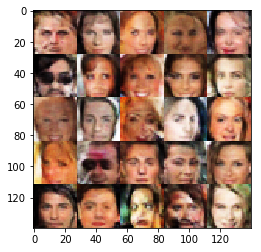

Epoch 5/5... Discriminator Loss: 1.1451... Generator Loss: 0.6349
Epoch 5/5... Discriminator Loss: 0.9576... Generator Loss: 0.8302
Epoch 5/5... Discriminator Loss: 1.7683... Generator Loss: 0.3086
Epoch 5/5... Discriminator Loss: 0.7388... Generator Loss: 1.2907
Epoch 5/5... Discriminator Loss: 0.9230... Generator Loss: 1.0343
Epoch 5/5... Discriminator Loss: 0.6979... Generator Loss: 1.1741
Epoch 5/5... Discriminator Loss: 1.2161... Generator Loss: 1.7253
Epoch 5/5... Discriminator Loss: 0.7368... Generator Loss: 1.3408
Epoch 5/5... Discriminator Loss: 0.8884... Generator Loss: 2.3543
Epoch 5/5... Discriminator Loss: 0.6944... Generator Loss: 1.1160
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


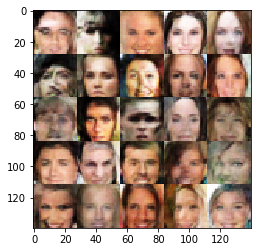

Epoch 5/5... Discriminator Loss: 0.5781... Generator Loss: 1.7670
Epoch 5/5... Discriminator Loss: 0.8439... Generator Loss: 1.3574
Epoch 5/5... Discriminator Loss: 0.9255... Generator Loss: 1.6010
Epoch 5/5... Discriminator Loss: 0.5997... Generator Loss: 2.3271
Epoch 5/5... Discriminator Loss: 0.7412... Generator Loss: 1.1570
Epoch 5/5... Discriminator Loss: 0.8187... Generator Loss: 0.9727
Epoch 5/5... Discriminator Loss: 1.3282... Generator Loss: 0.5257
Epoch 5/5... Discriminator Loss: 0.4756... Generator Loss: 2.6541
Epoch 5/5... Discriminator Loss: 1.0086... Generator Loss: 0.7864
Epoch 5/5... Discriminator Loss: 2.8660... Generator Loss: 0.2061
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


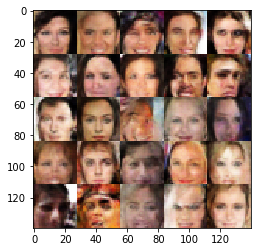

Epoch 5/5... Discriminator Loss: 1.9763... Generator Loss: 0.6487
Epoch 5/5... Discriminator Loss: 0.9844... Generator Loss: 1.2101
Epoch 5/5... Discriminator Loss: 1.7372... Generator Loss: 0.3419
Epoch 5/5... Discriminator Loss: 0.7070... Generator Loss: 1.2554
Epoch 5/5... Discriminator Loss: 1.1516... Generator Loss: 0.6505
Epoch 5/5... Discriminator Loss: 1.1230... Generator Loss: 0.6582
Epoch 5/5... Discriminator Loss: 0.7564... Generator Loss: 1.2158
Epoch 5/5... Discriminator Loss: 1.1165... Generator Loss: 0.6101
Epoch 5/5... Discriminator Loss: 1.0121... Generator Loss: 2.9077
Epoch 5/5... Discriminator Loss: 1.1788... Generator Loss: 1.4630
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


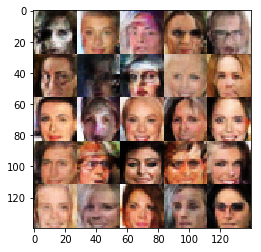

Epoch 5/5... Discriminator Loss: 1.2480... Generator Loss: 0.7531
Epoch 5/5... Discriminator Loss: 0.7143... Generator Loss: 1.0692
Epoch 5/5... Discriminator Loss: 0.9906... Generator Loss: 0.8763
Epoch 5/5... Discriminator Loss: 1.7253... Generator Loss: 0.3799
Epoch 5/5... Discriminator Loss: 0.7959... Generator Loss: 1.1126
Epoch 5/5... Discriminator Loss: 1.0611... Generator Loss: 2.2785
Epoch 5/5... Discriminator Loss: 0.9623... Generator Loss: 1.1895
Epoch 5/5... Discriminator Loss: 0.6165... Generator Loss: 1.9111
Epoch 5/5... Discriminator Loss: 0.7635... Generator Loss: 1.4146
Epoch 5/5... Discriminator Loss: 1.1044... Generator Loss: 1.0891
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


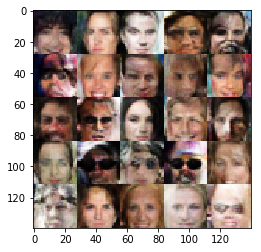

Epoch 5/5... Discriminator Loss: 1.0722... Generator Loss: 2.9371
Epoch 5/5... Discriminator Loss: 0.7586... Generator Loss: 1.0949
Epoch 5/5... Discriminator Loss: 1.2587... Generator Loss: 0.5818
Epoch 5/5... Discriminator Loss: 0.6329... Generator Loss: 1.5830
Epoch 5/5... Discriminator Loss: 1.5158... Generator Loss: 0.4085
Epoch 5/5... Discriminator Loss: 1.2597... Generator Loss: 0.6306
Epoch 5/5... Discriminator Loss: 1.3942... Generator Loss: 0.5155
Epoch 5/5... Discriminator Loss: 1.1884... Generator Loss: 0.6410
Epoch 5/5... Discriminator Loss: 0.9841... Generator Loss: 2.5230
Epoch 5/5... Discriminator Loss: 0.7446... Generator Loss: 1.3061
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


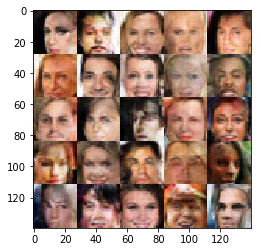

Epoch 5/5... Discriminator Loss: 1.1480... Generator Loss: 0.6179
Epoch 5/5... Discriminator Loss: 1.1606... Generator Loss: 3.3541
Epoch 5/5... Discriminator Loss: 1.8960... Generator Loss: 0.2686
Epoch 5/5... Discriminator Loss: 0.9729... Generator Loss: 0.8387
Epoch 5/5... Discriminator Loss: 0.7303... Generator Loss: 1.1458
Epoch 5/5... Discriminator Loss: 0.9135... Generator Loss: 3.0353
Epoch 5/5... Discriminator Loss: 1.0954... Generator Loss: 2.8003
Epoch 5/5... Discriminator Loss: 0.7548... Generator Loss: 1.2940
Epoch 5/5... Discriminator Loss: 0.6242... Generator Loss: 1.3151
Epoch 5/5... Discriminator Loss: 1.0209... Generator Loss: 0.8248
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


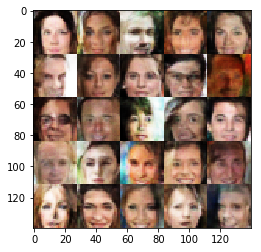

Epoch 5/5... Discriminator Loss: 0.9885... Generator Loss: 2.1011
Epoch 5/5... Discriminator Loss: 0.8588... Generator Loss: 1.4213
Epoch 5/5... Discriminator Loss: 1.4905... Generator Loss: 0.3861
Epoch 5/5... Discriminator Loss: 1.6042... Generator Loss: 2.5574
Epoch 5/5... Discriminator Loss: 1.3221... Generator Loss: 0.6014
Epoch 5/5... Discriminator Loss: 1.0240... Generator Loss: 0.7428
Epoch 5/5... Discriminator Loss: 1.1668... Generator Loss: 0.5743
Epoch 5/5... Discriminator Loss: 1.0672... Generator Loss: 0.7332
Epoch 5/5... Discriminator Loss: 1.6852... Generator Loss: 0.3574
Epoch 5/5... Discriminator Loss: 0.9030... Generator Loss: 0.9621
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


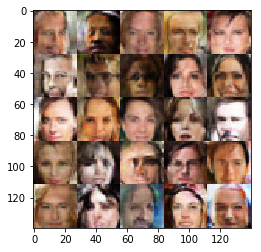

Epoch 5/5... Discriminator Loss: 1.6494... Generator Loss: 0.3780
Epoch 5/5... Discriminator Loss: 1.7638... Generator Loss: 1.4690
Epoch 5/5... Discriminator Loss: 2.9650... Generator Loss: 0.1766
Epoch 5/5... Discriminator Loss: 0.9779... Generator Loss: 1.8775
Epoch 5/5... Discriminator Loss: 1.5951... Generator Loss: 0.3696
Epoch 5/5... Discriminator Loss: 0.9091... Generator Loss: 0.9101
Epoch 5/5... Discriminator Loss: 1.0574... Generator Loss: 0.8206
Epoch 5/5... Discriminator Loss: 0.7805... Generator Loss: 2.1727
Epoch 5/5... Discriminator Loss: 0.7171... Generator Loss: 1.7561
Epoch 5/5... Discriminator Loss: 1.0941... Generator Loss: 0.6559
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


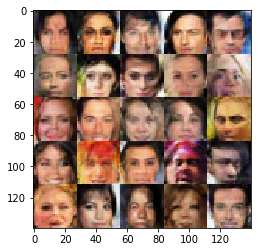

Epoch 5/5... Discriminator Loss: 1.5112... Generator Loss: 0.4384
Epoch 5/5... Discriminator Loss: 0.7319... Generator Loss: 1.6348
Epoch 5/5... Discriminator Loss: 0.8464... Generator Loss: 1.8989
Epoch 5/5... Discriminator Loss: 0.9786... Generator Loss: 0.8041
Epoch 5/5... Discriminator Loss: 1.1779... Generator Loss: 0.5872
Epoch 5/5... Discriminator Loss: 1.0473... Generator Loss: 0.7391
Epoch 5/5... Discriminator Loss: 1.0097... Generator Loss: 0.7594
Epoch 5/5... Discriminator Loss: 0.7261... Generator Loss: 1.9466
Epoch 5/5... Discriminator Loss: 0.9650... Generator Loss: 1.6195
Epoch 5/5... Discriminator Loss: 0.8704... Generator Loss: 1.8366
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


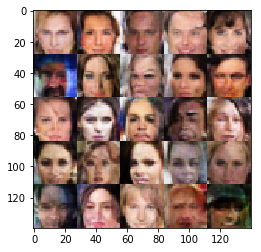

Epoch 5/5... Discriminator Loss: 1.3426... Generator Loss: 0.5132
Epoch 5/5... Discriminator Loss: 0.9028... Generator Loss: 0.8093
Epoch 5/5... Discriminator Loss: 1.1604... Generator Loss: 0.6493
Epoch 5/5... Discriminator Loss: 0.7916... Generator Loss: 1.2101
Epoch 5/5... Discriminator Loss: 1.1727... Generator Loss: 0.6707
Epoch 5/5... Discriminator Loss: 0.8933... Generator Loss: 0.8682
Epoch 5/5... Discriminator Loss: 0.7786... Generator Loss: 1.0545
Epoch 5/5... Discriminator Loss: 2.0214... Generator Loss: 0.3091
Epoch 5/5... Discriminator Loss: 1.1395... Generator Loss: 0.9493
Epoch 5/5... Discriminator Loss: 1.6458... Generator Loss: 0.3930
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


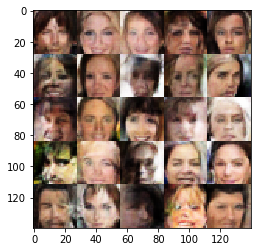

Epoch 5/5... Discriminator Loss: 0.9027... Generator Loss: 0.8390
Epoch 5/5... Discriminator Loss: 1.4324... Generator Loss: 0.5529
Epoch 5/5... Discriminator Loss: 1.2777... Generator Loss: 2.3181
Epoch 5/5... Discriminator Loss: 0.6755... Generator Loss: 1.3584
Epoch 5/5... Discriminator Loss: 1.1068... Generator Loss: 0.5663
Epoch 5/5... Discriminator Loss: 0.7383... Generator Loss: 2.0583
Epoch 5/5... Discriminator Loss: 1.2350... Generator Loss: 0.5992
Epoch 5/5... Discriminator Loss: 2.6348... Generator Loss: 0.3734
Epoch 5/5... Discriminator Loss: 0.9440... Generator Loss: 1.9434
Epoch 5/5... Discriminator Loss: 1.0499... Generator Loss: 0.8464
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


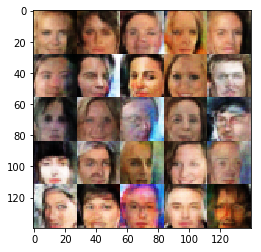

Epoch 5/5... Discriminator Loss: 0.8654... Generator Loss: 1.6295
Epoch 5/5... Discriminator Loss: 0.7891... Generator Loss: 1.5462
Epoch 5/5... Discriminator Loss: 0.7803... Generator Loss: 1.1059
Epoch 5/5... Discriminator Loss: 0.8868... Generator Loss: 1.1436
Epoch 5/5... Discriminator Loss: 1.1346... Generator Loss: 0.8928
Epoch 5/5... Discriminator Loss: 1.3242... Generator Loss: 0.5014
Epoch 5/5... Discriminator Loss: 0.7056... Generator Loss: 1.5433
Epoch 5/5... Discriminator Loss: 0.6598... Generator Loss: 3.5016
Epoch 5/5... Discriminator Loss: 0.8788... Generator Loss: 1.9170
Epoch 5/5... Discriminator Loss: 1.2674... Generator Loss: 0.5439
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


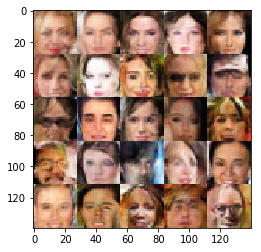

Epoch 5/5... Discriminator Loss: 0.8648... Generator Loss: 1.8599
Epoch 5/5... Discriminator Loss: 0.6453... Generator Loss: 1.3195
Epoch 5/5... Discriminator Loss: 1.1390... Generator Loss: 2.0171
Epoch 5/5... Discriminator Loss: 0.6623... Generator Loss: 1.4535
Epoch 5/5... Discriminator Loss: 1.1506... Generator Loss: 0.6625
Epoch 5/5... Discriminator Loss: 0.6087... Generator Loss: 1.5403
Epoch 5/5... Discriminator Loss: 0.6049... Generator Loss: 2.5826
Epoch 5/5... Discriminator Loss: 1.6390... Generator Loss: 0.3334
Epoch 5/5... Discriminator Loss: 1.5180... Generator Loss: 0.4083
Epoch 5/5... Discriminator Loss: 1.3848... Generator Loss: 0.5596
x1
(?, 7, 7, 256)
x2
(?, 14, 14, 128)
logits
(?, 28, 28, 3)


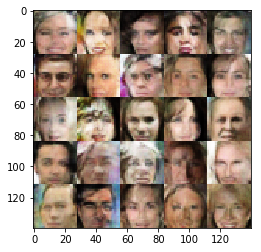

Epoch 5/5... Discriminator Loss: 1.0222... Generator Loss: 2.1215
Epoch 5/5... Discriminator Loss: 0.8731... Generator Loss: 0.9925


In [13]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.